# Spherical Cauchy VAE on MNIST

This notebook demonstrates how to use the Spherical Cauchy VAE framework on the MNIST dataset.

We'll walk through:
1. Data preparation
2. Model configuration
3. Training the model
4. Evaluating performance
5. Visualizing results
6. Generating new samples

In [1]:
import os
import sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

class ProgressBar:
    def __init__(self, iterable=None, **kwargs):
        self.iterable = iterable
        self.kwargs = kwargs
        self.is_notebook = False
        
        try:
            from tqdm.notebook import tqdm as notebook_tqdm
            test_bar = notebook_tqdm(range(1), leave=False)
            for _ in test_bar: pass
            self.tqdm = notebook_tqdm
            self.is_notebook = True
        except (ImportError, Exception) as e:
            print(f"Using standard tqdm progress bar (notebook version unavailable: {str(e)})")
            self.tqdm = std_tqdm
            
    def __call__(self, iterable=None, **kwargs):
        if iterable is None:
            iterable = self.iterable
        
        all_kwargs = {**self.kwargs}
        all_kwargs.update(kwargs)
        
        return self.tqdm(iterable, **all_kwargs)

tqdm = ProgressBar()

sys.path.append(os.path.abspath('..'))

from src.model import SpCauchyVAE
from src.config import SpCauchyVAEConfig
from src.utils import set_all_seeds

  0%|          | 0/1 [00:00<?, ?it/s]

## 1. Data Preparation

First, let's load the MNIST dataset using PyTorch's built-in datasets.

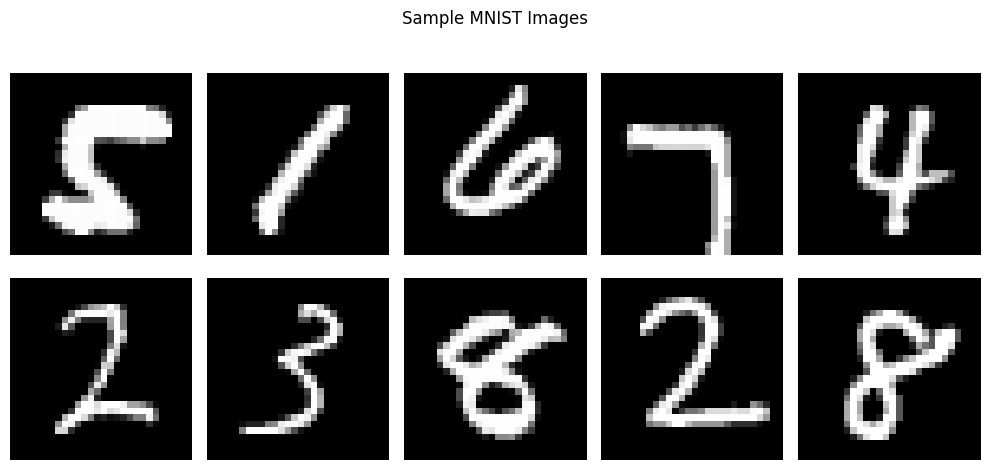

In [2]:
transform = transforms.Compose([
    transforms.ToTensor()
])

# Load MNIST datasets
train_dataset = datasets.MNIST(root='../data', train=True, download=True, transform=transform)
test_dataset = datasets.MNIST(root='../data', train=False, download=True, transform=transform)

# Create data loaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Display sample images
def show_images(images, title):
    plt.figure(figsize=(10, 5))
    for i in range(10):
        plt.subplot(2, 5, i+1)
        plt.imshow(images[i].reshape(28, 28), cmap='gray')
        plt.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Display sample MNIST images
images, labels = next(iter(train_loader))
show_images(images, 'Sample MNIST Images')

In [3]:
images.shape

torch.Size([128, 1, 28, 28])

## 2. Model Configuration

Now, let's configure the SpCauchyVAE model for MNIST. We'll use a CNN-based architecture for both encoder and decoder.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Set up the configuration for MNIST
config = SpCauchyVAEConfig(
    input_dim=[1, 28, 28],  # MNIST is grayscale 28x28
    
    latent_dim=3,  # Dimension of latent space
    hidden_dims=[32, 64, 128],  # Hidden dimensions for encoder/decoder
    
    encoder_type="cnn",
    decoder_type="cnn",
    
    is_image_input=True,
    
    kl_weight=1.0,  # Weight for KL divergence term
    dropout_rate=0.1,
    activation="relu",
    
    num_heads=4,
    num_layers=2
)



Using device: cuda


In [5]:
config

SpCauchyVAEConfig(input_dim=[1, 28, 28], latent_dim=3, hidden_dims=[32, 64, 128], distribution_type='spcauchy', encoder_type='cnn', decoder_type='cnn', channels=None, kernel_sizes=None, strides=None, num_heads=4, num_layers=2, dropout=0.1, vocab_size=None, embedding_dim=None, max_seq_len=None, pad_token_id=None, learning_rate=0.001, beta=1.0, batch_size=128, optimizer='adam', scheduler='cosine', weight_decay=0.0, device='cuda', seed=42)

In [6]:
model = SpCauchyVAE(config).to(device)

print(f"Model: SpCauchyVAE with {config.encoder_type} encoder and {config.decoder_type} decoder")
print(f"Latent dimension: {config.latent_dim}")

Model: SpCauchyVAE with cnn encoder and cnn decoder
Latent dimension: 3


## 3. Training the Model

Let's define a training function and train our model on MNIST.

In [7]:
def train(model, train_loader, optimizer, epoch):
    model.train()
    train_loss = 0
    recon_loss_sum = 0
    kl_loss_sum = 0
    
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch}")
    
    for batch_idx, (data, _) in enumerate(progress_bar):
        data = data.to(device)
        optimizer.zero_grad()
        
        recon_batch, mu, rho = model(data)
        
        loss, recon_loss, kl_loss = model.loss_function(data, recon_batch, mu, rho)
        
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        recon_loss_sum += recon_loss.item()
        kl_loss_sum += kl_loss.item()
        
        progress_bar.set_postfix(
            loss=f"{loss.item():.4f}", 
            recon=f"{recon_loss.item():.4f}", 
            kl=f"{kl_loss.item():.4f}"
        )
    
    avg_loss = train_loss / len(train_loader)
    avg_recon = recon_loss_sum / len(train_loader)
    avg_kl = kl_loss_sum / len(train_loader)
    
    print(f"====> Epoch: {epoch} Average loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}")
    
    return avg_loss, avg_recon, avg_kl

def test(model, test_loader):
    model.eval()
    test_loss = 0
    recon_loss_sum = 0
    kl_loss_sum = 0
    
    with torch.no_grad():
        for data, _ in test_loader:
            data = data.to(device)
            
            recon_batch, mu, rho = model(data)
            
            loss, recon_loss, kl_loss = model.loss_function(data, recon_batch,  mu, rho)
            
            test_loss += loss.item()
            recon_loss_sum += recon_loss.item()
            kl_loss_sum += kl_loss.item()
    
    avg_loss = test_loss / len(test_loader)
    avg_recon = recon_loss_sum / len(test_loader)
    avg_kl = kl_loss_sum / len(test_loader)
    
    print(f"====> Test set loss: {avg_loss:.4f}, Recon: {avg_recon:.4f}, KL: {avg_kl:.4f}")
    
    return avg_loss, avg_recon, avg_kl

In [ ]:
optimizer = optim.AdamW(model.parameters(), lr=0.0005)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer, 
    mode='min',
    factor=0.5,
    patience=5
)

num_epochs = 50
train_losses = []
test_losses = []
recon_losses = []
kl_losses = []

set_all_seeds(42)

for epoch in range(1, num_epochs + 1):
    train_loss, train_recon, train_kl = train(model, train_loader, optimizer, epoch)
    train_losses.append(train_loss)
    
    test_loss, test_recon, test_kl = test(model, test_loader)
    test_losses.append(test_loss)
    recon_losses.append(test_recon)
    kl_losses.append(test_kl)
    
    scheduler.step(test_loss)

Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 211.1816, Recon: 209.2169, KL: 1.9647
====> Test set loss: 175.8566, Recon: 170.2754, KL: 5.5812


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 163.9164, Recon: 158.2475, KL: 5.6689
====> Test set loss: 159.7452, Recon: 154.1806, KL: 5.5647


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 158.3018, Recon: 152.2410, KL: 6.0609
====> Test set loss: 155.8224, Recon: 149.7901, KL: 6.0323


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 155.0041, Recon: 148.6834, KL: 6.3207
====> Test set loss: 152.9297, Recon: 146.8917, KL: 6.0380


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 152.4206, Recon: 145.9383, KL: 6.4823
====> Test set loss: 151.2459, Recon: 144.6750, KL: 6.5709


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 150.5030, Recon: 143.9072, KL: 6.5958
====> Test set loss: 149.2519, Recon: 142.6532, KL: 6.5986


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 148.8924, Recon: 142.1809, KL: 6.7115
====> Test set loss: 148.7132, Recon: 141.8841, KL: 6.8291


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 148.1017, Recon: 141.3248, KL: 6.7769
====> Test set loss: 147.3672, Recon: 140.9321, KL: 6.4351


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 147.3648, Recon: 140.5602, KL: 6.8046
====> Test set loss: 147.6951, Recon: 140.6017, KL: 7.0934


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 145.9426, Recon: 138.9629, KL: 6.9797
====> Test set loss: 145.8562, Recon: 138.5875, KL: 7.2687


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 145.3934, Recon: 138.3771, KL: 7.0163
====> Test set loss: 145.0395, Recon: 138.1868, KL: 6.8527


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 145.5322, Recon: 138.5067, KL: 7.0254
====> Test set loss: 146.2995, Recon: 139.4669, KL: 6.8326


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 144.1605, Recon: 137.0924, KL: 7.0681
====> Test set loss: 144.4637, Recon: 137.6976, KL: 6.7660


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 144.1683, Recon: 137.0543, KL: 7.1140
====> Test set loss: 144.6851, Recon: 137.5412, KL: 7.1439


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 143.4922, Recon: 136.3483, KL: 7.1439
====> Test set loss: 143.2281, Recon: 135.9074, KL: 7.3207


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 142.9849, Recon: 135.8063, KL: 7.1786
====> Test set loss: 143.3586, Recon: 136.1607, KL: 7.1978


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 142.4687, Recon: 135.2161, KL: 7.2525
====> Test set loss: 142.5266, Recon: 135.1912, KL: 7.3354


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 142.5848, Recon: 135.3056, KL: 7.2792
====> Test set loss: 142.6159, Recon: 135.3936, KL: 7.2223


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 142.2218, Recon: 134.9977, KL: 7.2241
====> Test set loss: 143.6998, Recon: 136.3232, KL: 7.3766


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 141.6504, Recon: 134.3590, KL: 7.2913
====> Test set loss: 142.1662, Recon: 135.3186, KL: 6.8476


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 141.1830, Recon: 133.8173, KL: 7.3657
====> Test set loss: 141.4531, Recon: 134.3743, KL: 7.0788


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 141.0602, Recon: 133.7028, KL: 7.3574
====> Test set loss: 142.3389, Recon: 134.8388, KL: 7.5001


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 141.0144, Recon: 133.6542, KL: 7.3602
====> Test set loss: 141.1867, Recon: 134.0788, KL: 7.1079


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 140.3426, Recon: 132.9077, KL: 7.4349
====> Test set loss: 140.7601, Recon: 133.6712, KL: 7.0888


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 139.9717, Recon: 132.4613, KL: 7.5103
====> Test set loss: 141.5409, Recon: 134.0280, KL: 7.5128


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 140.3740, Recon: 132.9747, KL: 7.3992
====> Test set loss: 141.7174, Recon: 134.6861, KL: 7.0313


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 139.8618, Recon: 132.4038, KL: 7.4580
====> Test set loss: 141.1570, Recon: 133.2908, KL: 7.8662


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 139.7254, Recon: 132.1942, KL: 7.5312
====> Test set loss: 141.2733, Recon: 133.6663, KL: 7.6069


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 140.0097, Recon: 132.5146, KL: 7.4951
====> Test set loss: 141.7953, Recon: 134.0627, KL: 7.7327


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 140.6783, Recon: 133.2445, KL: 7.4337
====> Test set loss: 140.7115, Recon: 132.9758, KL: 7.7358


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 140.0275, Recon: 132.4555, KL: 7.5720
====> Test set loss: 140.6770, Recon: 132.9728, KL: 7.7041


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 139.1559, Recon: 131.5797, KL: 7.5763
====> Test set loss: 140.0020, Recon: 132.1296, KL: 7.8724


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 139.3510, Recon: 131.7591, KL: 7.5919
====> Test set loss: 139.7944, Recon: 132.2436, KL: 7.5508


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 138.5298, Recon: 130.9167, KL: 7.6131
====> Test set loss: 139.7513, Recon: 132.3562, KL: 7.3951


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 138.2629, Recon: 130.6459, KL: 7.6170
====> Test set loss: 139.3629, Recon: 132.1634, KL: 7.1995


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 138.5466, Recon: 130.9885, KL: 7.5581
====> Test set loss: 139.3929, Recon: 131.5571, KL: 7.8358


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 137.9359, Recon: 130.3068, KL: 7.6291
====> Test set loss: 139.0929, Recon: 131.5348, KL: 7.5582


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 138.5563, Recon: 130.9874, KL: 7.5689
====> Test set loss: 139.6972, Recon: 132.2654, KL: 7.4319


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 137.8768, Recon: 130.2076, KL: 7.6692
====> Test set loss: 138.6757, Recon: 130.8874, KL: 7.7882


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 138.6733, Recon: 131.0683, KL: 7.6050
====> Test set loss: 139.7425, Recon: 132.1477, KL: 7.5948


Epoch 41:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 41 Average loss: 137.7050, Recon: 130.0538, KL: 7.6511
====> Test set loss: 138.8282, Recon: 131.2980, KL: 7.5302


Epoch 42:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 42 Average loss: 137.6996, Recon: 130.0473, KL: 7.6523
====> Test set loss: 139.3066, Recon: 131.6700, KL: 7.6366


Epoch 43:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 43 Average loss: 138.0724, Recon: 130.3575, KL: 7.7149
====> Test set loss: 139.5726, Recon: 131.9858, KL: 7.5868


Epoch 44:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 44 Average loss: 137.5816, Recon: 129.9222, KL: 7.6594
====> Test set loss: 138.5301, Recon: 130.9102, KL: 7.6199


Epoch 45:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 45 Average loss: 137.1757, Recon: 129.4830, KL: 7.6927
====> Test set loss: 138.8218, Recon: 131.0240, KL: 7.7978


Epoch 46:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 46 Average loss: 137.4809, Recon: 129.8033, KL: 7.6776
====> Test set loss: 138.8586, Recon: 131.4016, KL: 7.4570


Epoch 47:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 47 Average loss: 137.6523, Recon: 129.9307, KL: 7.7216
====> Test set loss: 139.2080, Recon: 131.5300, KL: 7.6780


Epoch 48:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 48 Average loss: 137.2174, Recon: 129.4524, KL: 7.7651
====> Test set loss: 138.9225, Recon: 130.9467, KL: 7.9758


Epoch 49:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 49 Average loss: 137.4524, Recon: 129.7167, KL: 7.7357
====> Test set loss: 139.4566, Recon: 131.4619, KL: 7.9946


Epoch 50:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 50 Average loss: 137.0577, Recon: 129.2467, KL: 7.8110
====> Test set loss: 138.3037, Recon: 130.6441, KL: 7.6597


## 4. Visualizing Training Progress

Let's plot the training and test losses to see our model's progress.

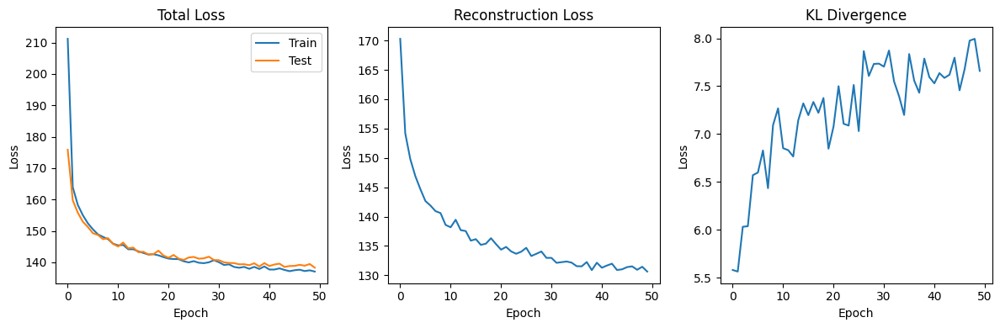

In [ ]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Train')
plt.plot(test_losses, label='Test')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Total Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(recon_losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Reconstruction Loss')

plt.subplot(1, 3, 3)
plt.plot(kl_losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('KL Divergence')

plt.tight_layout()
plt.show()

## 5. Visualizing Reconstructions

Let's see how well our model reconstructs the test images.

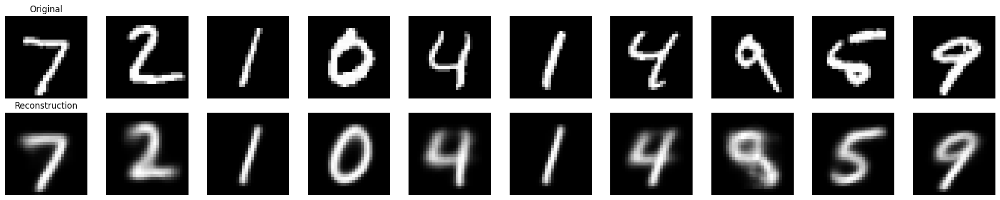

In [ ]:
def plot_reconstructions(model, data_loader, n=10):
    model.eval()
    with torch.no_grad():
        data, _ = next(iter(data_loader))
        data = data[:n].to(device)
        recon_data, _, _ = model(data)
        
        plt.figure(figsize=(20, 4))
        for i in range(n):
            # Original
            plt.subplot(2, n, i+1)
            plt.imshow(data[i].cpu().numpy().reshape(28, 28), cmap='gray')
            plt.axis('off')
            if i == 0:
                plt.title('Original')
            
            # Reconstruction
            plt.subplot(2, n, i+n+1)
            plt.imshow(recon_data[i].cpu().numpy().reshape(28, 28), cmap='gray')
            plt.axis('off')
            if i == 0:
                plt.title('Reconstruction')
        
        plt.tight_layout()
        plt.show()

plot_reconstructions(model, test_loader)

## 6. Visualizing the Latent Space

Let's visualize the latent space by encoding a subset of test data and projecting it to 2D using t-SNE.

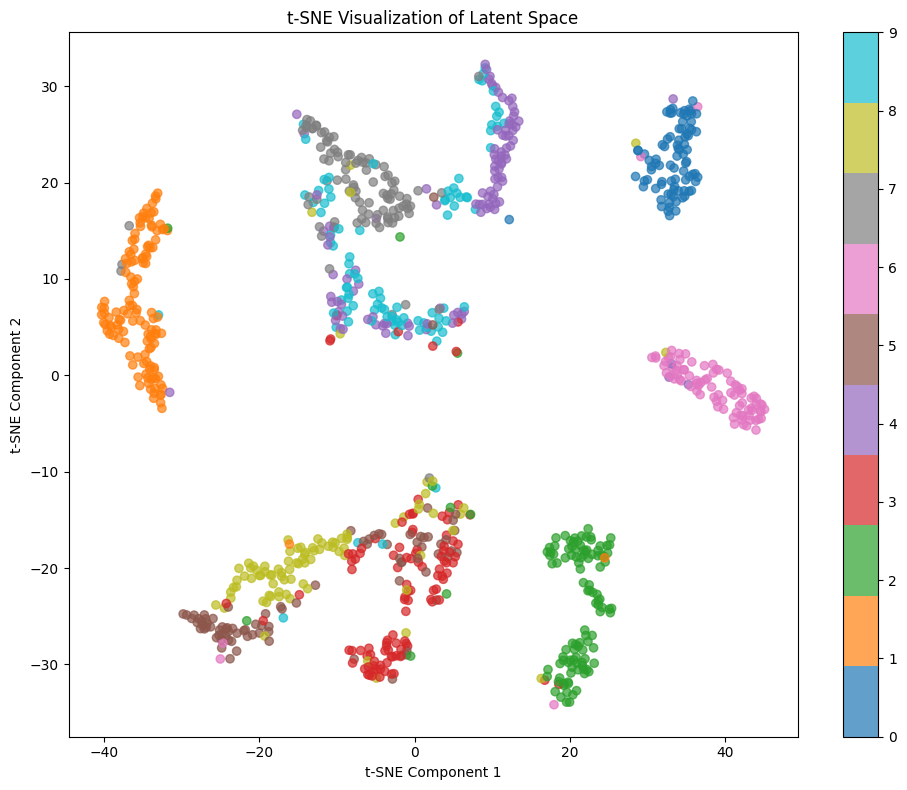

In [ ]:
from sklearn.manifold import TSNE

def visualize_latent_space(model, data_loader, n=1000):
    model.eval()
    latent_vectors = []
    labels = []
    
    with torch.no_grad():
        for data, label in data_loader:
            if len(latent_vectors) * data_loader.batch_size >= n:
                break
                
            data = data.to(device)
            mu, _ = model.encode(data)
            latent_vectors.append(mu.cpu().numpy())
            labels.append(label.numpy())
    
    latent_vectors = np.concatenate(latent_vectors, axis=0)[:n]
    labels = np.concatenate(labels, axis=0)[:n]
    
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_vectors)
    
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels, cmap='tab10', alpha=0.7)
    plt.colorbar(scatter)
    plt.title('t-SNE Visualization of Latent Space')
    plt.xlabel('t-SNE Component 1')
    plt.ylabel('t-SNE Component 2')
    plt.tight_layout()
    plt.show()

visualize_latent_space(model, test_loader)

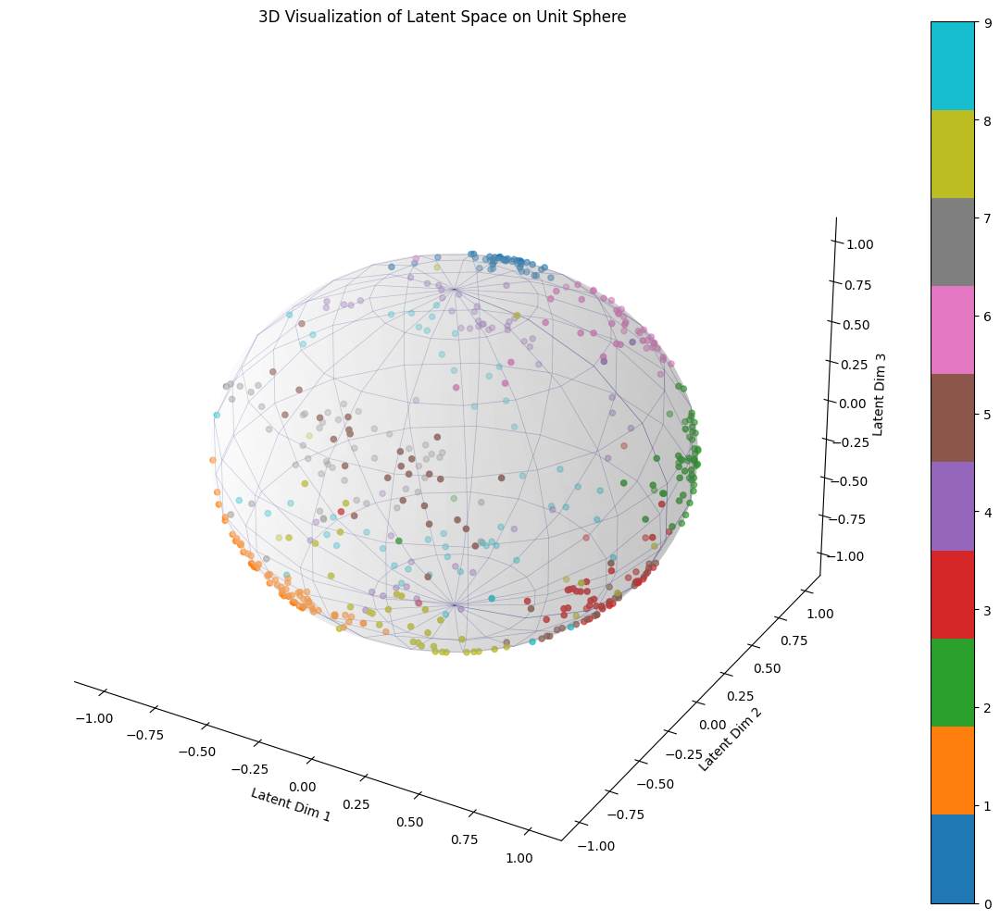

In [ ]:
def visualize_latent_space_on_sphere(model, data_loader, n=500):
    model.eval()
    latent_vectors = []
    labels = []
    
    with torch.no_grad():
        for data, label in data_loader:
            if len(latent_vectors) * data_loader.batch_size >= n:
                break
                
            data = data.to(device)
            mu, _ = model.encode(data)
            latent_vectors.append(mu.cpu().numpy())
            labels.append(label.numpy())
    
    latent_vectors = np.concatenate(latent_vectors, axis=0)[:n]
    labels = np.concatenate(labels, axis=0)[:n]
    

    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Create a sphere mesh for context 
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    xs = np.outer(np.cos(u), np.sin(v))
    ys = np.outer(np.sin(u), np.sin(v))
    zs = np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_surface(xs, ys, zs, color='w', alpha=0.2)

    u_grid = np.linspace(0, 2 * np.pi, 20)
    v_grid = np.linspace(0, np.pi, 10)
    x_grid = np.outer(np.cos(u_grid), np.sin(v_grid))
    y_grid = np.outer(np.sin(u_grid), np.sin(v_grid))
    z_grid = np.outer(np.ones(np.size(u_grid)), np.cos(v_grid))
    
    grid = ax.plot_wireframe(x_grid, y_grid, z_grid, color='navy', alpha=0.3, linewidth=0.5)
    
    sc = ax.scatter(latent_vectors[:, 0], latent_vectors[:, 1], latent_vectors[:, 2],
                    c=labels, cmap='tab10', s=20)
    plt.colorbar(sc, ax=ax)

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.grid(False)

    
    ax.set_title('3D Visualization of Latent Space on Unit Sphere')
    ax.set_xlabel('Latent Dim 1')
    ax.set_ylabel('Latent Dim 2')
    ax.set_zlabel('Latent Dim 3')
    plt.tight_layout()
    plt.show()

visualize_latent_space_on_sphere(model, test_loader)


C:\Users\lukin\AppData\Local\Temp\ipykernel_7256\311639504.py:73: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


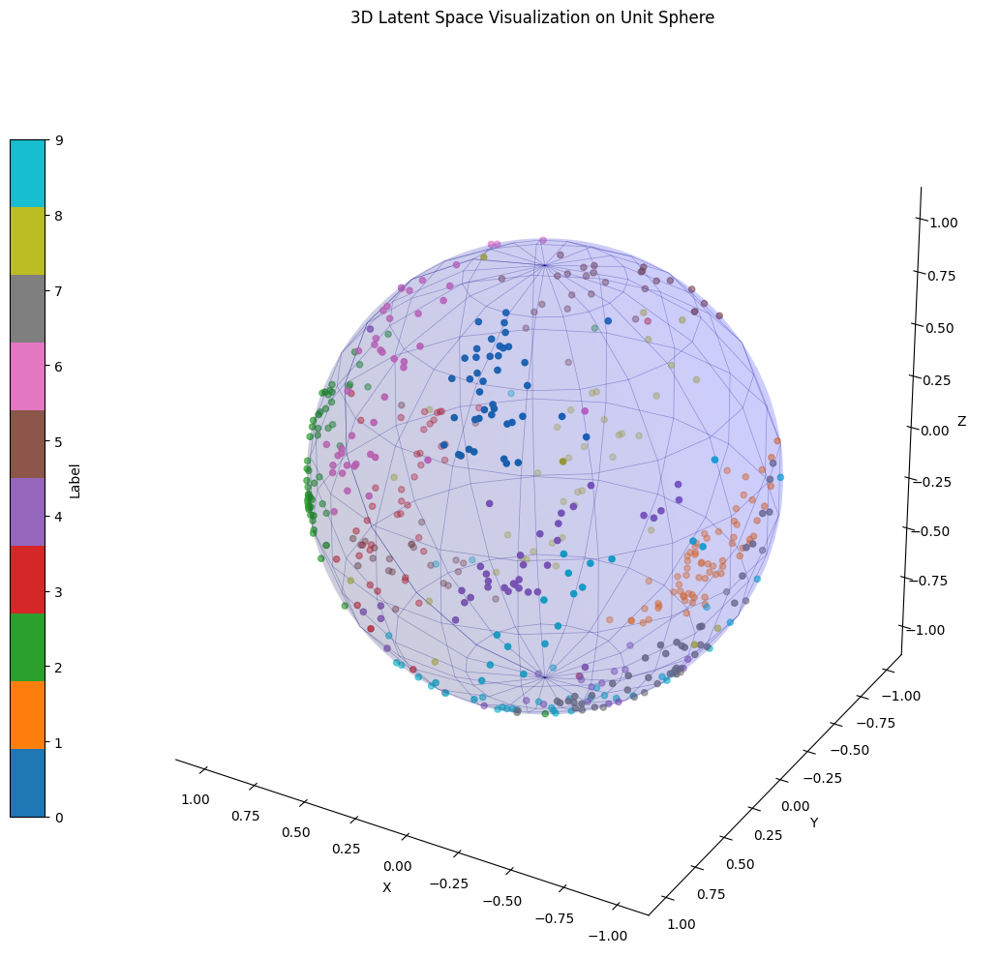

In [ ]:
def visualize_latent_space_on_sphere_side_by_side(model, data_loader, n=500, figsize=(12, 10), alpha=0.1):
    model.eval()
    latent_vectors = []
    labels = []
    
    with torch.no_grad():
        for data, label in data_loader:
            if len(latent_vectors) * data_loader.batch_size >= n:
                break
            data = data.to(device)
            mu, _ = model.encode(data)
            latent_vectors.append(mu.cpu().numpy())
            labels.append(label.numpy())
    
    latent_vectors = np.concatenate(latent_vectors, axis=0)[:n]
    labels = np.concatenate(labels, axis=0)[:n]
    
    norms = np.linalg.norm(latent_vectors, axis=1, keepdims=True)
    latent_vectors = latent_vectors / norms
    
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_surface(x, y, z, color='b', alpha=alpha)
    
    u_grid = np.linspace(0, 2 * np.pi, 20)
    v_grid = np.linspace(0, np.pi, 10)
    x_grid = np.outer(np.cos(u_grid), np.sin(v_grid))
    y_grid = np.outer(np.sin(u_grid), np.sin(v_grid))
    z_grid = np.outer(np.ones(np.size(u_grid)), np.cos(v_grid))
    ax.plot_wireframe(x_grid, y_grid, z_grid, color='navy', alpha=0.3, linewidth=0.5)
    
    sc = ax.scatter(latent_vectors[:, 0], latent_vectors[:, 1], latent_vectors[:, 2],
                    c=labels, cmap='tab10', s=20)
    
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.grid(False)
    
    ax.set_box_aspect([1, 1, 1])
    

    ax.view_init(elev=30, azim=120)
    
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Latent Space Visualization on Unit Sphere')
    
    cbar_ax = fig.add_axes([0.05, 0.15, 0.03, 0.7])
    cbar = plt.colorbar(sc, cax=cbar_ax)
    cbar.set_label('Label')
    
    plt.tight_layout()
    plt.show()

visualize_latent_space_on_sphere_side_by_side(model, test_loader)



## 7. Generating New Samples

Let's generate some new samples by sampling from the prior distribution.

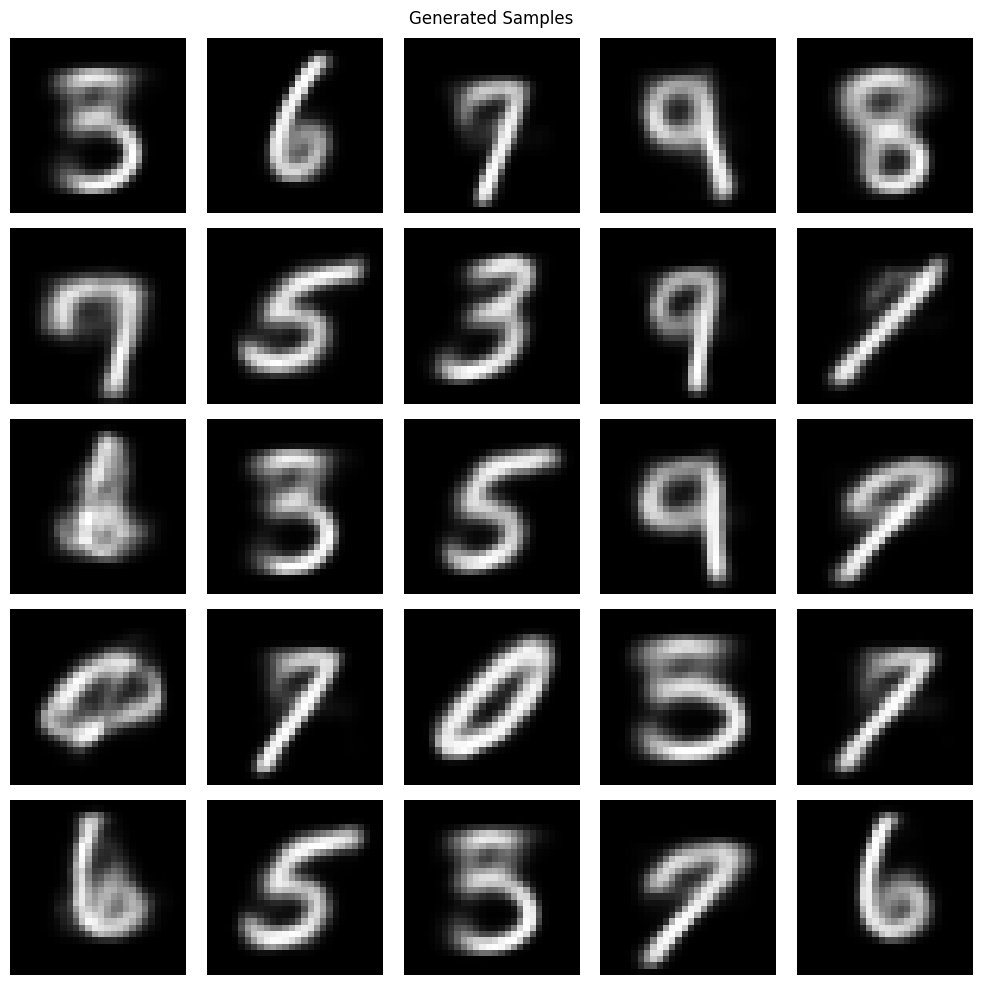

In [ ]:
def generate_samples(model, n_samples=25):
    model.eval()
    with torch.no_grad():
        samples = model.generate_samples(num_samples=n_samples)
        
        plt.figure(figsize=(10, 10))
        for i in range(n_samples):
            plt.subplot(5, 5, i+1)
            plt.imshow(samples[i].cpu().numpy().reshape(28, 28), cmap='gray')
            plt.axis('off')
        
        plt.suptitle('Generated Samples')
        plt.tight_layout()
        plt.show()

generate_samples(model)

## 8. Interpolating in the Latent Space

Let's create an interpolation between two digits in the latent space to visualize the manifold.

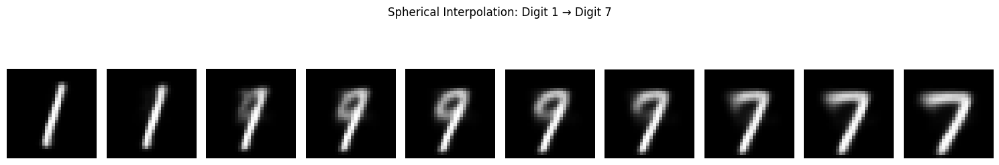

In [ ]:
def spherical_interpolation(p1, p2, steps=10):
    """Perform spherical linear interpolation between two points on unit sphere"""
    omega = torch.acos((p1 * p2).sum())
    
    if omega < 1e-6:  
        return torch.stack([p1] * steps)
    
    t = torch.linspace(0, 1, steps, device=p1.device)
    
    sin_omega = torch.sin(omega)
    interp_points = []
    
    for ti in t:
        # SLERP formula
        interp = (torch.sin((1-ti) * omega) / sin_omega) * p1 + \
                  (torch.sin(ti * omega) / sin_omega) * p2
        interp_points.append(interp)
    
    return torch.stack(interp_points)

def visualize_interpolation(model, data_loader):
    model.eval()
    with torch.no_grad():
        data, labels = next(iter(data_loader))
        
        digit_indices = {}
        for i, label in enumerate(labels):
            label = label.item()
            if label not in digit_indices:
                digit_indices[label] = i
                
        idx1 = digit_indices.get(1, 0)
        idx2 = digit_indices.get(7, 1)
        
        x1 = data[idx1:idx1+1].to(device)
        x2 = data[idx2:idx2+1].to(device)
        
        mu1, _ = model.encode(x1)
        mu2, _ = model.encode(x2)
        
        steps = 10
        interp_points = spherical_interpolation(mu1[0], mu2[0], steps)
        
        interp_decoded = model.decode(interp_points)
        
        plt.figure(figsize=(15, 3))
        for i in range(steps):
            plt.subplot(1, steps, i+1)
            plt.imshow(interp_decoded[i].cpu().numpy().reshape(28, 28), cmap='gray')
            plt.axis('off')
            
        plt.suptitle(f'Spherical Interpolation: Digit {labels[idx1].item()} → Digit {labels[idx2].item()}')
        plt.tight_layout()
        plt.show()

visualize_interpolation(model, test_loader)

## 9. Save the Trained Model

In [ ]:
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'config': config,
}, '../models/mnist_spcauchy_vae.pt')

print("Model saved to: ../models/mnist_spcauchy_vae.pt")

Model saved to: ../models/mnist_spcauchy_vae.pt


In [ ]:
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
checkpoint = torch.load('../models/mnist_spcauchy_vae.pt')
model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
config = checkpoint['config']

## 10. Conclusion

In this notebook, we've successfully:

1. Loaded and prepared the MNIST dataset
2. Created and configured a Spherical Cauchy VAE model
3. Trained the model on MNIST
4. Visualized the model's performance through reconstructions
5. Explored the latent space using t-SNE
6. Generated new samples from the prior distribution
7. Created interpolations between digits in the latent space

The Spherical Cauchy VAE offers unique benefits for learning on manifold-like data by constraining the latent space to lie on a hypersphere, potentially resulting in better representations for certain types of data.

## 11. Visualizing the 3D Latent Sphere with Generated Images
In this section, we'll visualize the 3D latent space as a sphere and overlay it with generated MNIST digits.

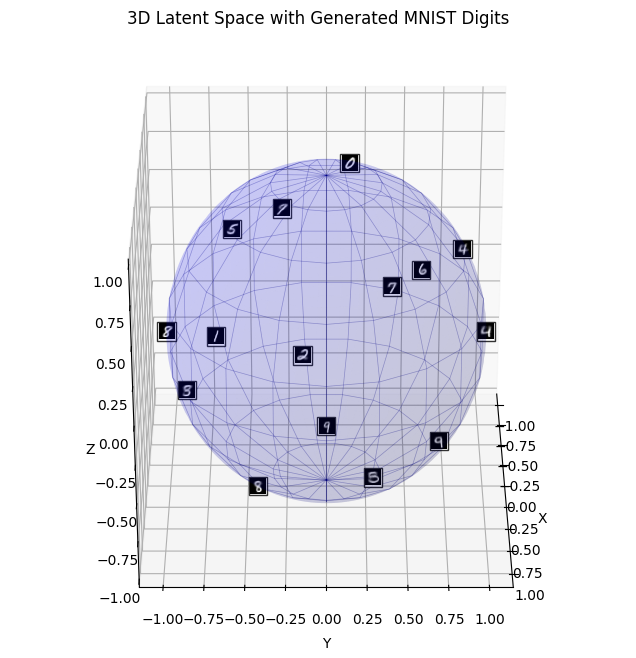

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.mplot3d import proj3d
import matplotlib.animation as animation

def sample_sphere_points(n_points=15):
    """Generate evenly distributed points on a unit sphere using the Fibonacci sphere algorithm"""
    points = []
    phi = np.pi * (3. - np.sqrt(5.))  # golden angle in radians
    
    for i in range(n_points):
        y = 1 - (i / float(n_points - 1)) * 2  
        radius = np.sqrt(1 - y * y)  
        
        theta = phi * i  
        
        x = np.cos(theta) * radius
        z = np.sin(theta) * radius
        
        points.append((x, y, z))
    
    return np.array(points)

def plot_sphere_with_images(model, n_points=15, figsize=(12, 10), alpha=0.1):
    """Plot a 3D sphere with generated images at specified points"""
    points = sample_sphere_points(n_points)
    
    z_points = torch.tensor(points, dtype=torch.float32).to(device)
    
    with torch.no_grad():
        generated_images = model.decode(z_points).cpu().numpy()
    
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    
    ax.plot_surface(x, y, z, color='b', alpha=alpha)
    
    u_grid = np.linspace(0, 2 * np.pi, 20)
    v_grid = np.linspace(0, np.pi, 10)
    x_grid = np.outer(np.cos(u_grid), np.sin(v_grid))
    y_grid = np.outer(np.sin(u_grid), np.sin(v_grid))
    z_grid = np.outer(np.ones(np.size(u_grid)), np.cos(v_grid))
    
    ax.plot_wireframe(x_grid, y_grid, z_grid, color='navy', alpha=0.3, linewidth=0.5)
    
    for i, (point, img) in enumerate(zip(points, generated_images)):
        x, y, z = point
        
        img_reshaped = img.reshape(28, 28)
        
        img_fig = plt.figure(figsize=(1, 1))
        img_ax = img_fig.add_subplot(111)
        img_ax.imshow(img_reshaped, cmap='gray')
        img_ax.axis('off')
        img_fig.tight_layout(pad=0)
        
        from io import BytesIO
        buf = BytesIO()
        img_fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
        buf.seek(0)
        
        from PIL import Image
        img_arr = np.array(Image.open(buf))
        
        plt.close(img_fig)
        
        x2d, y2d, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
        
        imagebox = OffsetImage(img_arr, zoom=0.15, cmap='gray')
        ab = AnnotationBbox(imagebox, (x2d, y2d), frameon=False, pad=0)
        ax.add_artist(ab)
    
    ax.set_box_aspect([1,1,1])
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Latent Space Visualization with Generated MNIST Digits')
    
    def update_positions(event):
        for i, (ab, point) in enumerate(zip(ax.artists, points)):
            x, y, z = point
            x2d, y2d, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
            ab.xy = (x2d, y2d)
    
    fig.canvas.mpl_connect('motion_notify_event', update_positions)
    
    plt.tight_layout()
    return fig

def create_rotating_sphere_animation(model, n_points=10, n_frames=36, fig_size=(10, 8)):
    """Create an animation of a rotating sphere with MNIST digits"""
    points = sample_sphere_points(n_points)
    
    z_points = torch.tensor(points, dtype=torch.float32).to(device)
    
    with torch.no_grad():
        generated_images = model.decode(z_points).cpu().numpy()
    
    fig = plt.figure(figsize=fig_size)
    ax = fig.add_subplot(111, projection='3d')
    
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    x = np.outer(np.cos(u), np.sin(v))
    y = np.outer(np.sin(u), np.sin(v))
    z = np.outer(np.ones(np.size(u)), np.cos(v))
    
    sphere = ax.plot_surface(x, y, z, color='b', alpha=0.1)
    

    u_grid = np.linspace(0, 2 * np.pi, 20)
    v_grid = np.linspace(0, np.pi, 10)
    x_grid = np.outer(np.cos(u_grid), np.sin(v_grid))
    y_grid = np.outer(np.sin(u_grid), np.sin(v_grid))
    z_grid = np.outer(np.ones(np.size(u_grid)), np.cos(v_grid))
    
    grid = ax.plot_wireframe(x_grid, y_grid, z_grid, color='navy', alpha=0.3, linewidth=0.5)
    
    ax.set_box_aspect([1,1,1])
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Latent Space with Generated MNIST Digits')
    
    annotations = []
    
    def animate(i):
        for ann in annotations:
            ann.remove()
        annotations.clear()
        
        ax.view_init(elev=30, azim=i * 10)
        
        for point, img in zip(points, generated_images):
            x, y, z = point
            x2d, y2d, _ = proj3d.proj_transform(x, y, z, ax.get_proj())
            
            img_reshaped = img.reshape(28, 28)
            imagebox = OffsetImage(img_reshaped, zoom=0.4, cmap='gray')  
            
            ab = AnnotationBbox(imagebox, (x2d, y2d), frameon=True, pad=0.1, 
                                bboxprops=dict(facecolor='white', alpha=0.8))
            ann = ax.add_artist(ab)
            annotations.append(ann)
        
        return annotations
    
    anim = animation.FuncAnimation(fig, animate, frames=n_frames, interval=150, blit=False)
    
    return anim

from IPython.display import HTML
rotating_anim = create_rotating_sphere_animation(model, n_points=15)
HTML(rotating_anim.to_jshtml())


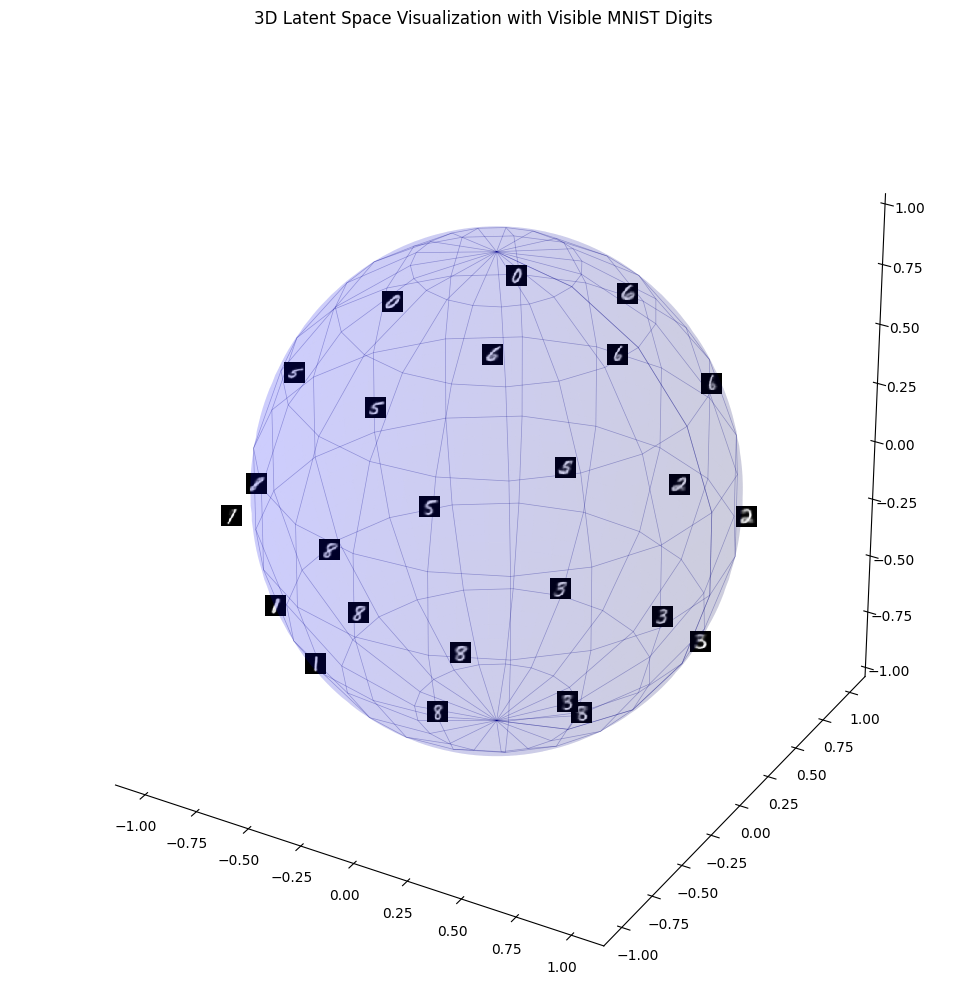

In [ ]:
def plot_sphere_with_images_visible_only(model, n_points=15, figsize=(12, 10), alpha=0.1):
    """Plot a 3D sphere with generated images only for the points visible from the current view."""
    points = sample_sphere_points(n_points)
    
    z_points = torch.tensor(points, dtype=torch.float32).to(device)
    
    with torch.no_grad():
        generated_images = model.decode(z_points).cpu().numpy()
    
    fig = plt.figure(figsize=figsize)
    ax = fig.add_subplot(111, projection='3d')
    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False
    ax.xaxis.pane.set_edgecolor('w')
    ax.yaxis.pane.set_edgecolor('w')
    ax.zaxis.pane.set_edgecolor('w')
    ax.grid(False)
    
  
    u = np.linspace(0, 2 * np.pi, 100)
    v = np.linspace(0, np.pi, 100)
    xs = np.outer(np.cos(u), np.sin(v))
    ys = np.outer(np.sin(u), np.sin(v))
    zs = np.outer(np.ones(np.size(u)), np.cos(v))
    ax.plot_surface(xs, ys, zs, color='b', alpha=alpha)
    

    u_grid = np.linspace(0, 2 * np.pi, 20)
    v_grid = np.linspace(0, np.pi, 10)
    x_grid = np.outer(np.cos(u_grid), np.sin(v_grid))
    y_grid = np.outer(np.sin(u_grid), np.sin(v_grid))
    z_grid = np.outer(np.ones(np.size(u_grid)), np.cos(v_grid))
    ax.plot_wireframe(x_grid, y_grid, z_grid, color='navy', alpha=0.3, linewidth=0.5)
    

    azim = ax.azim 
    elev = ax.elev
    azim_rad = np.deg2rad(azim)
    elev_rad = np.deg2rad(elev)
    cam_vec = np.array([np.cos(elev_rad)*np.cos(azim_rad),
                        np.cos(elev_rad)*np.sin(azim_rad),
                        np.sin(elev_rad)])
    
    for point, img in zip(points, generated_images):
        if np.dot(point, cam_vec) <= 0:
            continue
        
        x_pt, y_pt, z_pt = point
        
        img_reshaped = img.reshape(28, 28)
        
        img_fig = plt.figure(figsize=(1, 1))
        img_ax = img_fig.add_subplot(111)
        img_ax.imshow(img_reshaped, cmap='gray')
        img_ax.axis('off')
        img_fig.tight_layout(pad=0)
        
        from io import BytesIO
        buf = BytesIO()
        img_fig.savefig(buf, format='png', bbox_inches='tight', pad_inches=0)
        buf.seek(0)
        
        from PIL import Image
        img_arr = np.array(Image.open(buf))
        
        plt.close(img_fig)
        
        x2d, y2d, _ = proj3d.proj_transform(x_pt, y_pt, z_pt, ax.get_proj())
        imagebox = OffsetImage(img_arr, zoom=0.15, cmap='gray')
        ab = AnnotationBbox(imagebox, (x2d, y2d), frameon=False, pad=0)
        ax.add_artist(ab)
    
    

    ax.set_box_aspect([1, 1, 1])
    ax.set_title('3D Latent Space Visualization with Visible MNIST Digits')
    
    
    
    plt.tight_layout()
    plt.show()
p = plot_sphere_with_images_visible_only(model, n_points=50, figsize=(12, 10), alpha=0.1)

## 12. Comparison with normal distribution 

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

config2 = SpCauchyVAEConfig(
    input_dim=[1, 28, 28],  # MNIST is grayscale 28x28
    
    distribution_type= "normal",
    latent_dim=2, 
    hidden_dims=[32, 64, 128],  
    
    encoder_type="cnn",
    decoder_type="cnn",
    
    is_image_input=True,
    
    kl_weight=1.0, 
    dropout_rate=0.1,
    activation="relu",
    
    num_heads=4,
    num_layers=2
)

Using device: cuda


In [ ]:
model_temp = SpCauchyVAE(config2).to(device)

print(f"Model: SpCauchyVAE with {config2.encoder_type} encoder and {config2.decoder_type} decoder")
print(f"Latent dimension: {config2.latent_dim}")

Model: SpCauchyVAE with cnn encoder and cnn decoder
Latent dimension: 2


In [ ]:
optimizer2 = optim.AdamW(model_normal.parameters(), lr=0.0005)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer2, 
    mode='min',
    factor=0.5,
    patience=5
)

num_epochs = 50
train_losses = []
test_losses = []
recon_losses = []
kl_losses = []

set_all_seeds(42)

for epoch in range(1, num_epochs + 1):
    train_loss, train_recon, train_kl = train(model_normal, train_loader, optimizer2, epoch)
    train_losses.append(train_loss)
    
    test_loss, test_recon, test_kl = test(model_normal, test_loader)
    test_losses.append(test_loss)
    recon_losses.append(test_recon)
    kl_losses.append(test_kl)
    
    scheduler.step(test_loss)

Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 201.2489, Recon: 198.3798, KL: 2.8691
====> Test set loss: 166.6049, Recon: 161.9092, KL: 4.6957


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 161.0095, Recon: 155.8564, KL: 5.1531
====> Test set loss: 157.3472, Recon: 152.0533, KL: 5.2938


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 155.7132, Recon: 150.1322, KL: 5.5810
====> Test set loss: 153.6920, Recon: 148.1654, KL: 5.5266


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 152.7288, Recon: 146.9339, KL: 5.7949
====> Test set loss: 151.3395, Recon: 145.1266, KL: 6.2130


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 150.5183, Recon: 144.5653, KL: 5.9530
====> Test set loss: 149.5451, Recon: 143.4216, KL: 6.1235


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 148.9149, Recon: 142.8370, KL: 6.0779
====> Test set loss: 147.9498, Recon: 141.9008, KL: 6.0490


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 147.7143, Recon: 141.5337, KL: 6.1806
====> Test set loss: 147.7877, Recon: 141.4755, KL: 6.3122


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 146.7148, Recon: 140.4444, KL: 6.2704
====> Test set loss: 148.4637, Recon: 142.2814, KL: 6.1823


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 145.7705, Recon: 139.4296, KL: 6.3408
====> Test set loss: 145.7107, Recon: 139.3966, KL: 6.3141


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 145.0364, Recon: 138.6358, KL: 6.4005
====> Test set loss: 145.4388, Recon: 139.2712, KL: 6.1676


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 144.3424, Recon: 137.8745, KL: 6.4679
====> Test set loss: 145.4157, Recon: 139.1297, KL: 6.2860


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 143.7043, Recon: 137.2063, KL: 6.4980
====> Test set loss: 144.2401, Recon: 137.7268, KL: 6.5133


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 143.1823, Recon: 136.6596, KL: 6.5227
====> Test set loss: 143.9695, Recon: 137.4662, KL: 6.5033


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 142.6562, Recon: 136.0844, KL: 6.5717
====> Test set loss: 143.5242, Recon: 136.9218, KL: 6.6024


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 142.0378, Recon: 135.4398, KL: 6.5980
====> Test set loss: 142.8747, Recon: 136.2214, KL: 6.6533


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 141.7517, Recon: 135.1039, KL: 6.6478
====> Test set loss: 142.9262, Recon: 136.2879, KL: 6.6382


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 141.3430, Recon: 134.6764, KL: 6.6666
====> Test set loss: 142.0751, Recon: 135.3168, KL: 6.7583


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 141.0529, Recon: 134.3512, KL: 6.7018
====> Test set loss: 141.7483, Recon: 135.1300, KL: 6.6183


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 140.6017, Recon: 133.8765, KL: 6.7252
====> Test set loss: 142.4485, Recon: 135.8143, KL: 6.6342


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 140.2281, Recon: 133.4623, KL: 6.7658
====> Test set loss: 141.3364, Recon: 134.5333, KL: 6.8030


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 139.9595, Recon: 133.1782, KL: 6.7814
====> Test set loss: 141.6336, Recon: 134.8950, KL: 6.7385


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 139.6889, Recon: 132.9083, KL: 6.7806
====> Test set loss: 141.5736, Recon: 134.8522, KL: 6.7214


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 139.3731, Recon: 132.5560, KL: 6.8172
====> Test set loss: 140.6523, Recon: 133.9342, KL: 6.7181


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 139.1715, Recon: 132.3331, KL: 6.8384
====> Test set loss: 140.8299, Recon: 134.1112, KL: 6.7187


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 138.8010, Recon: 131.9466, KL: 6.8543
====> Test set loss: 140.5822, Recon: 133.7265, KL: 6.8556


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 138.5949, Recon: 131.7189, KL: 6.8760
====> Test set loss: 140.3582, Recon: 133.4742, KL: 6.8840


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 138.4569, Recon: 131.5743, KL: 6.8826
====> Test set loss: 140.0278, Recon: 133.1375, KL: 6.8904


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 138.3108, Recon: 131.4054, KL: 6.9054
====> Test set loss: 139.9774, Recon: 133.1465, KL: 6.8309


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 138.1819, Recon: 131.2727, KL: 6.9092
====> Test set loss: 140.2694, Recon: 133.3815, KL: 6.8879


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 137.9486, Recon: 131.0096, KL: 6.9390
====> Test set loss: 140.2714, Recon: 133.2256, KL: 7.0458


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 137.7048, Recon: 130.7505, KL: 6.9543
====> Test set loss: 139.6675, Recon: 132.8039, KL: 6.8636


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 137.5254, Recon: 130.5611, KL: 6.9642
====> Test set loss: 140.1465, Recon: 133.2068, KL: 6.9397


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 137.3688, Recon: 130.3968, KL: 6.9719
====> Test set loss: 140.3092, Recon: 133.4072, KL: 6.9020


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 137.2532, Recon: 130.2773, KL: 6.9759
====> Test set loss: 139.5007, Recon: 132.6995, KL: 6.8012


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 137.0285, Recon: 130.0217, KL: 7.0069
====> Test set loss: 139.7973, Recon: 132.8248, KL: 6.9725


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 137.0802, Recon: 130.0845, KL: 6.9957
====> Test set loss: 139.8338, Recon: 132.8271, KL: 7.0067


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 136.7190, Recon: 129.7131, KL: 7.0059
====> Test set loss: 139.4517, Recon: 132.4151, KL: 7.0366


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 136.6628, Recon: 129.6253, KL: 7.0375
====> Test set loss: 139.6653, Recon: 132.4830, KL: 7.1822


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 136.3781, Recon: 129.3377, KL: 7.0404
====> Test set loss: 138.8564, Recon: 131.8483, KL: 7.0082


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 136.3621, Recon: 129.3199, KL: 7.0422
====> Test set loss: 139.1796, Recon: 132.1389, KL: 7.0407


Epoch 41:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 41 Average loss: 136.3052, Recon: 129.2408, KL: 7.0644
====> Test set loss: 139.4030, Recon: 132.2562, KL: 7.1468


Epoch 42:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 42 Average loss: 136.1633, Recon: 129.1004, KL: 7.0629
====> Test set loss: 138.9211, Recon: 131.7873, KL: 7.1338


Epoch 43:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 43 Average loss: 136.3478, Recon: 129.2897, KL: 7.0581
====> Test set loss: 138.9034, Recon: 131.7575, KL: 7.1458


Epoch 44:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 44 Average loss: 135.9582, Recon: 128.8802, KL: 7.0780
====> Test set loss: 138.8717, Recon: 131.9883, KL: 6.8833


Epoch 45:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 45 Average loss: 135.7365, Recon: 128.6409, KL: 7.0956
====> Test set loss: 138.7333, Recon: 131.6597, KL: 7.0737


Epoch 46:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 46 Average loss: 135.5961, Recon: 128.4794, KL: 7.1167
====> Test set loss: 138.9843, Recon: 131.7265, KL: 7.2578


Epoch 47:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 47 Average loss: 135.6903, Recon: 128.5744, KL: 7.1159
====> Test set loss: 138.7743, Recon: 131.7586, KL: 7.0157


Epoch 48:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 48 Average loss: 135.4217, Recon: 128.3048, KL: 7.1169
====> Test set loss: 138.6308, Recon: 131.5969, KL: 7.0339


Epoch 49:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 49 Average loss: 135.4090, Recon: 128.2974, KL: 7.1116
====> Test set loss: 138.6083, Recon: 131.4879, KL: 7.1205


Epoch 50:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 50 Average loss: 135.5317, Recon: 128.4088, KL: 7.1229
====> Test set loss: 138.4111, Recon: 131.3905, KL: 7.0206


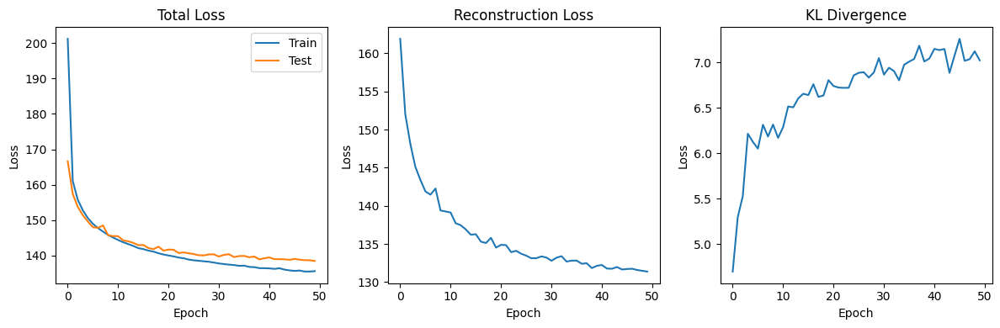

In [ ]:
plt.figure(figsize=(12, 4))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Train')
plt.plot(test_losses, label='Test')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Total Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(recon_losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Reconstruction Loss')

plt.subplot(1, 3, 3)
plt.plot(kl_losses)
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('KL Divergence')

plt.tight_layout()
plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


cfg = SpCauchyVAEConfig(
    input_dim=[1, 28, 28],  # MNIST is grayscale 28x28
    
    distribution_type= "normal",
    latent_dim=2, 
    hidden_dims=[32, 64, 128], 
    
    encoder_type="cnn",
    decoder_type="cnn",
    
    is_image_input=True,
    
    kl_weight=1.0,  
    dropout_rate=0.1,
    activation="relu",
    
    num_heads=4,
    num_layers=2
)


latent_dims = [2, 3, 5, 10, 20, 50]
lr1 = 0.0005
lr2 = 0.0001
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

recon_normal = []
reckon_spcauchy = []

for lat_dim in latent_dims:
    if lat_dim > 3:
        lr = lr2
    else:
        lr = lr1
    cfg.latent_dim = lat_dim
    cfg.distribution_type = "normal"
    set_all_seeds(42)
    model = SpCauchyVAE(cfg).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, 
        mode='min',
        factor=0.5,
        patience=5
    )
    
    # Training loop
    num_epochs = 40
    train_losses = []
    test_losses = []
    recon_losses = []
    kl_losses = []
    

    
    for epoch in range(1, num_epochs + 1):
        # Train model
        train_loss, train_recon, train_kl = train(model, train_loader, optimizer, epoch)
        train_losses.append(train_loss)
        
        # Test model
        test_loss, test_recon, test_kl = test(model, test_loader)
        test_losses.append(test_loss)
        recon_losses.append(test_recon)
        kl_losses.append(test_kl)
        
        # Update learning rate
        scheduler.step(test_loss)

    # Save the  smalles reconstruction loss
    recon_normal.append(min(recon_losses))

    cfg.distribution_type = "spcauchy"
    cfg.latent_dim = lat_dim + 1
    set_all_seeds(42)
    model = SpCauchyVAE(cfg).to(device)
    optimizer = optim.AdamW(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, 
        mode='min',
        factor=0.5,
        patience=5
    )

    train_losses = []
    test_losses = []
    recon_losses = []
    kl_losses = []
    
    for epoch in range(1, num_epochs + 1):
        # Train model
        train_loss, train_recon, train_kl = train(model, train_loader, optimizer, epoch)
        train_losses.append(train_loss)
        
        # Test model
        test_loss, test_recon, test_kl = test(model, test_loader)
        test_losses.append(test_loss)
        recon_losses.append(test_recon)
        kl_losses.append(test_kl)
        
        # Update learning rate
        scheduler.step(test_loss)

    # Save the final reconstruction loss
    reckon_spcauchy.append(min(recon_losses))



Using device: cuda


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 214.9677, Recon: 213.9180, KL: 1.0498
====> Test set loss: 175.5696, Recon: 171.2043, KL: 4.3652


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 164.4000, Recon: 159.4867, KL: 4.9133
====> Test set loss: 158.7599, Recon: 153.6097, KL: 5.1502


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 156.9660, Recon: 151.5193, KL: 5.4467
====> Test set loss: 155.1289, Recon: 149.7625, KL: 5.3663


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 153.6902, Recon: 148.0020, KL: 5.6882
====> Test set loss: 152.2745, Recon: 146.5007, KL: 5.7738


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 151.2786, Recon: 145.4170, KL: 5.8615
====> Test set loss: 151.2090, Recon: 145.3811, KL: 5.8279


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 149.5528, Recon: 143.5671, KL: 5.9857
====> Test set loss: 149.0140, Recon: 142.7165, KL: 6.2975


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 148.4016, Recon: 142.3188, KL: 6.0828
====> Test set loss: 149.3472, Recon: 143.4194, KL: 5.9278


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 147.3187, Recon: 141.1681, KL: 6.1506
====> Test set loss: 146.9507, Recon: 140.4508, KL: 6.4999


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 146.4863, Recon: 140.2528, KL: 6.2335
====> Test set loss: 146.6724, Recon: 140.5248, KL: 6.1476


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 145.6411, Recon: 139.3429, KL: 6.2982
====> Test set loss: 146.0082, Recon: 139.5694, KL: 6.4388


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 144.9888, Recon: 138.6488, KL: 6.3400
====> Test set loss: 145.2407, Recon: 138.9510, KL: 6.2897


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 144.3161, Recon: 137.9219, KL: 6.3942
====> Test set loss: 144.7212, Recon: 138.2684, KL: 6.4528


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 143.8321, Recon: 137.4135, KL: 6.4186
====> Test set loss: 144.7162, Recon: 138.4907, KL: 6.2255


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 143.3360, Recon: 136.8812, KL: 6.4548
====> Test set loss: 144.1640, Recon: 137.9403, KL: 6.2237


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 142.8736, Recon: 136.3742, KL: 6.4994
====> Test set loss: 143.4030, Recon: 136.8015, KL: 6.6015


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 142.5368, Recon: 135.9952, KL: 6.5415
====> Test set loss: 143.1168, Recon: 136.4890, KL: 6.6279


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 141.9493, Recon: 135.3810, KL: 6.5683
====> Test set loss: 143.0691, Recon: 136.2593, KL: 6.8098


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 141.7986, Recon: 135.1966, KL: 6.6019
====> Test set loss: 142.4604, Recon: 135.8049, KL: 6.6555


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 141.4055, Recon: 134.7887, KL: 6.6168
====> Test set loss: 142.6550, Recon: 136.0365, KL: 6.6185


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 141.0955, Recon: 134.4429, KL: 6.6526
====> Test set loss: 142.2807, Recon: 135.8238, KL: 6.4570


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 140.7547, Recon: 134.0876, KL: 6.6671
====> Test set loss: 141.8661, Recon: 135.2963, KL: 6.5698


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 140.4769, Recon: 133.7880, KL: 6.6889
====> Test set loss: 141.9841, Recon: 135.3365, KL: 6.6476


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 140.3039, Recon: 133.5971, KL: 6.7068
====> Test set loss: 141.3938, Recon: 134.6770, KL: 6.7168


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 139.9437, Recon: 133.2100, KL: 6.7337
====> Test set loss: 141.7351, Recon: 134.8830, KL: 6.8521


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 139.6835, Recon: 132.9389, KL: 6.7446
====> Test set loss: 141.1798, Recon: 134.2874, KL: 6.8924


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 139.4544, Recon: 132.6794, KL: 6.7750
====> Test set loss: 141.8331, Recon: 134.9773, KL: 6.8559


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 139.3208, Recon: 132.5465, KL: 6.7743
====> Test set loss: 140.9738, Recon: 134.2624, KL: 6.7114


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 139.0375, Recon: 132.2334, KL: 6.8041
====> Test set loss: 140.8668, Recon: 134.2865, KL: 6.5803


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 138.8597, Recon: 132.0368, KL: 6.8229
====> Test set loss: 140.7474, Recon: 133.9022, KL: 6.8452


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 138.6465, Recon: 131.7946, KL: 6.8520
====> Test set loss: 140.7333, Recon: 133.9730, KL: 6.7603


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 138.5646, Recon: 131.7199, KL: 6.8447
====> Test set loss: 140.2901, Recon: 133.4087, KL: 6.8814


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 138.3016, Recon: 131.4387, KL: 6.8629
====> Test set loss: 140.7999, Recon: 134.1010, KL: 6.6989


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 138.1726, Recon: 131.2947, KL: 6.8780
====> Test set loss: 140.3381, Recon: 133.4365, KL: 6.9016


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 138.0290, Recon: 131.1443, KL: 6.8847
====> Test set loss: 140.3888, Recon: 133.5023, KL: 6.8865


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 137.8215, Recon: 130.9046, KL: 6.9169
====> Test set loss: 140.6163, Recon: 133.7765, KL: 6.8398


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 137.7193, Recon: 130.8242, KL: 6.8951
====> Test set loss: 140.2464, Recon: 133.1971, KL: 7.0493


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 137.4939, Recon: 130.5612, KL: 6.9327
====> Test set loss: 140.3307, Recon: 133.4199, KL: 6.9109


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 137.4017, Recon: 130.4691, KL: 6.9325
====> Test set loss: 139.9849, Recon: 132.9825, KL: 7.0025


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 137.1852, Recon: 130.2302, KL: 6.9550
====> Test set loss: 139.8992, Recon: 132.9559, KL: 6.9433


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 137.1513, Recon: 130.1855, KL: 6.9658
====> Test set loss: 139.8098, Recon: 132.7232, KL: 7.0866


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 196.8668, Recon: 192.9901, KL: 3.8767
====> Test set loss: 163.4492, Recon: 157.6576, KL: 5.7915


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 160.7227, Recon: 154.8341, KL: 5.8887
====> Test set loss: 158.0847, Recon: 152.1056, KL: 5.9791


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 155.1670, Recon: 148.9106, KL: 6.2564
====> Test set loss: 152.1668, Recon: 146.0443, KL: 6.1224


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 152.7184, Recon: 146.2201, KL: 6.4983
====> Test set loss: 150.5308, Recon: 144.0760, KL: 6.4547


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 149.4450, Recon: 142.7463, KL: 6.6987
====> Test set loss: 150.6911, Recon: 143.8244, KL: 6.8667


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 149.4830, Recon: 142.7738, KL: 6.7091
====> Test set loss: 147.6263, Recon: 140.7553, KL: 6.8710


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 146.4637, Recon: 139.5759, KL: 6.8878
====> Test set loss: 145.7224, Recon: 138.5774, KL: 7.1449


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 145.3838, Recon: 138.3697, KL: 7.0141
====> Test set loss: 145.4074, Recon: 138.4393, KL: 6.9681


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 145.0852, Recon: 138.0454, KL: 7.0397
====> Test set loss: 146.3764, Recon: 138.9547, KL: 7.4217


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 144.9566, Recon: 137.8654, KL: 7.0912
====> Test set loss: 144.0108, Recon: 136.7219, KL: 7.2889


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 143.6685, Recon: 136.5242, KL: 7.1443
====> Test set loss: 143.5546, Recon: 136.2705, KL: 7.2841


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 142.8036, Recon: 135.6259, KL: 7.1777
====> Test set loss: 143.4331, Recon: 136.0169, KL: 7.4162


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 142.5939, Recon: 135.2816, KL: 7.3123
====> Test set loss: 143.7564, Recon: 136.1281, KL: 7.6283


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 142.7087, Recon: 135.4393, KL: 7.2694
====> Test set loss: 142.2558, Recon: 135.3748, KL: 6.8810


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 141.9976, Recon: 134.7132, KL: 7.2844
====> Test set loss: 141.5841, Recon: 134.0704, KL: 7.5138


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 141.0835, Recon: 133.7049, KL: 7.3786
====> Test set loss: 141.0293, Recon: 133.8743, KL: 7.1550


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 141.0917, Recon: 133.7204, KL: 7.3713
====> Test set loss: 142.4301, Recon: 135.0563, KL: 7.3738


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 140.9085, Recon: 133.5268, KL: 7.3816
====> Test set loss: 140.6951, Recon: 133.4103, KL: 7.2848


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 140.8850, Recon: 133.4937, KL: 7.3914
====> Test set loss: 140.4446, Recon: 132.7475, KL: 7.6971


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 140.8879, Recon: 133.4649, KL: 7.4230
====> Test set loss: 141.6702, Recon: 134.0927, KL: 7.5775


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 139.9197, Recon: 132.4447, KL: 7.4751
====> Test set loss: 140.7629, Recon: 132.8763, KL: 7.8865


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 140.1112, Recon: 132.6018, KL: 7.5094
====> Test set loss: 141.0130, Recon: 133.4843, KL: 7.5287


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 139.7411, Recon: 132.1861, KL: 7.5551
====> Test set loss: 140.1882, Recon: 132.5792, KL: 7.6091


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 139.2750, Recon: 131.7744, KL: 7.5006
====> Test set loss: 140.0228, Recon: 132.4967, KL: 7.5261


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 139.6079, Recon: 132.0453, KL: 7.5626
====> Test set loss: 139.9774, Recon: 132.1562, KL: 7.8212


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 139.1259, Recon: 131.5581, KL: 7.5678
====> Test set loss: 139.7868, Recon: 131.9261, KL: 7.8606


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 139.1781, Recon: 131.6297, KL: 7.5484
====> Test set loss: 139.9390, Recon: 132.3812, KL: 7.5578


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 138.7930, Recon: 131.1797, KL: 7.6133
====> Test set loss: 139.1631, Recon: 131.4769, KL: 7.6863


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 138.5020, Recon: 130.9254, KL: 7.5767
====> Test set loss: 139.2342, Recon: 131.7826, KL: 7.4516


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 138.3235, Recon: 130.6672, KL: 7.6563
====> Test set loss: 139.7255, Recon: 132.0500, KL: 7.6756


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 138.6062, Recon: 130.9194, KL: 7.6868
====> Test set loss: 138.7628, Recon: 131.0203, KL: 7.7425


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 137.7533, Recon: 130.1377, KL: 7.6156
====> Test set loss: 138.7028, Recon: 130.6784, KL: 8.0244


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 137.7900, Recon: 130.0829, KL: 7.7071
====> Test set loss: 138.6216, Recon: 130.7528, KL: 7.8688


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 137.5958, Recon: 129.8315, KL: 7.7643
====> Test set loss: 138.5534, Recon: 130.9284, KL: 7.6250


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 137.8035, Recon: 130.1239, KL: 7.6796
====> Test set loss: 137.9254, Recon: 130.4623, KL: 7.4632


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 137.3749, Recon: 129.6591, KL: 7.7158
====> Test set loss: 138.3523, Recon: 130.4548, KL: 7.8976


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 137.0230, Recon: 129.2939, KL: 7.7292
====> Test set loss: 138.0442, Recon: 130.3680, KL: 7.6762


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 137.0104, Recon: 129.2423, KL: 7.7682
====> Test set loss: 138.3234, Recon: 130.2446, KL: 8.0789


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 137.5902, Recon: 129.8602, KL: 7.7300
====> Test set loss: 137.8662, Recon: 130.1306, KL: 7.7356


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 136.6288, Recon: 128.8430, KL: 7.7858
====> Test set loss: 137.4687, Recon: 129.4609, KL: 8.0078


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 207.6884, Recon: 205.2578, KL: 2.4306
====> Test set loss: 161.1100, Recon: 154.9695, KL: 6.1406


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 151.5582, Recon: 144.6426, KL: 6.9156
====> Test set loss: 145.7716, Recon: 138.5719, KL: 7.1997


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 143.7080, Recon: 136.2150, KL: 7.4929
====> Test set loss: 141.1733, Recon: 133.6179, KL: 7.5554


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 139.9253, Recon: 132.0967, KL: 7.8286
====> Test set loss: 138.4565, Recon: 130.7258, KL: 7.7307


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 137.4630, Recon: 129.4184, KL: 8.0445
====> Test set loss: 137.2502, Recon: 129.4394, KL: 7.8109


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 135.6908, Recon: 127.4964, KL: 8.1945
====> Test set loss: 135.3495, Recon: 127.1383, KL: 8.2112


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 134.2678, Recon: 125.9550, KL: 8.3128
====> Test set loss: 134.1787, Recon: 125.8701, KL: 8.3086


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 133.1823, Recon: 124.7888, KL: 8.3935
====> Test set loss: 133.0461, Recon: 124.4683, KL: 8.5778


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 132.2574, Recon: 123.7689, KL: 8.4886
====> Test set loss: 133.0482, Recon: 124.2980, KL: 8.7502


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 131.5473, Recon: 123.0110, KL: 8.5363
====> Test set loss: 131.8778, Recon: 123.4343, KL: 8.4435


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 130.8550, Recon: 122.2631, KL: 8.5919
====> Test set loss: 131.4423, Recon: 122.9430, KL: 8.4993


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 130.3150, Recon: 121.6716, KL: 8.6434
====> Test set loss: 131.0397, Recon: 122.4112, KL: 8.6285


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 129.7939, Recon: 121.1245, KL: 8.6694
====> Test set loss: 130.5956, Recon: 122.0587, KL: 8.5369


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 129.3281, Recon: 120.6187, KL: 8.7095
====> Test set loss: 130.6879, Recon: 122.4113, KL: 8.2765


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 128.9638, Recon: 120.2360, KL: 8.7278
====> Test set loss: 130.2711, Recon: 121.6889, KL: 8.5822


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 128.5471, Recon: 119.7607, KL: 8.7864
====> Test set loss: 130.5097, Recon: 121.9251, KL: 8.5846


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 128.2141, Recon: 119.4168, KL: 8.7973
====> Test set loss: 129.7650, Recon: 120.8819, KL: 8.8831


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 127.8889, Recon: 119.0387, KL: 8.8502
====> Test set loss: 129.9425, Recon: 121.5380, KL: 8.4045


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 127.5532, Recon: 118.6954, KL: 8.8577
====> Test set loss: 129.1385, Recon: 120.1801, KL: 8.9583


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 127.2550, Recon: 118.3869, KL: 8.8681
====> Test set loss: 129.0658, Recon: 120.2838, KL: 8.7820


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 127.0055, Recon: 118.1110, KL: 8.8945
====> Test set loss: 129.1844, Recon: 120.5703, KL: 8.6142


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 126.7697, Recon: 117.8693, KL: 8.9004
====> Test set loss: 129.1949, Recon: 120.2374, KL: 8.9575


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 126.5651, Recon: 117.6316, KL: 8.9335
====> Test set loss: 128.8793, Recon: 119.8594, KL: 9.0199


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 126.3746, Recon: 117.4127, KL: 8.9619
====> Test set loss: 128.5773, Recon: 119.5161, KL: 9.0612


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 126.0789, Recon: 117.1146, KL: 8.9643
====> Test set loss: 128.4579, Recon: 119.4099, KL: 9.0479


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 125.8763, Recon: 116.8876, KL: 8.9887
====> Test set loss: 128.3440, Recon: 119.3930, KL: 8.9510


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 125.7201, Recon: 116.7259, KL: 8.9941
====> Test set loss: 128.2988, Recon: 119.3709, KL: 8.9279


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 125.5749, Recon: 116.5664, KL: 9.0085
====> Test set loss: 128.4414, Recon: 119.4582, KL: 8.9832


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 125.3468, Recon: 116.3286, KL: 9.0182
====> Test set loss: 128.3885, Recon: 119.3790, KL: 9.0095


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 125.2164, Recon: 116.1704, KL: 9.0460
====> Test set loss: 128.0322, Recon: 119.0142, KL: 9.0180


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 125.0868, Recon: 116.0319, KL: 9.0549
====> Test set loss: 128.2849, Recon: 119.3269, KL: 8.9579


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 124.8832, Recon: 115.8155, KL: 9.0677
====> Test set loss: 128.4479, Recon: 119.6917, KL: 8.7562


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 124.7178, Recon: 115.6324, KL: 9.0855
====> Test set loss: 128.1292, Recon: 119.3275, KL: 8.8017


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 124.5748, Recon: 115.4780, KL: 9.0968
====> Test set loss: 127.9083, Recon: 118.9910, KL: 8.9173


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 124.4985, Recon: 115.3963, KL: 9.1023
====> Test set loss: 127.7977, Recon: 118.7501, KL: 9.0475


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 124.3558, Recon: 115.2457, KL: 9.1100
====> Test set loss: 127.4354, Recon: 118.4170, KL: 9.0185


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 124.2149, Recon: 115.1004, KL: 9.1145
====> Test set loss: 127.7366, Recon: 118.6514, KL: 9.0852


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 124.0340, Recon: 114.8933, KL: 9.1407
====> Test set loss: 127.7316, Recon: 118.3878, KL: 9.3438


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 123.9686, Recon: 114.8215, KL: 9.1472
====> Test set loss: 127.7214, Recon: 118.6875, KL: 9.0339


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 123.7544, Recon: 114.5981, KL: 9.1563
====> Test set loss: 127.7248, Recon: 118.7435, KL: 8.9813


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 198.6179, Recon: 194.5111, KL: 4.1069
====> Test set loss: 150.2661, Recon: 142.8131, KL: 7.4530


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 144.8204, Recon: 136.8191, KL: 8.0012
====> Test set loss: 141.5667, Recon: 133.0961, KL: 8.4706


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 139.7585, Recon: 131.3256, KL: 8.4330
====> Test set loss: 138.5179, Recon: 130.2206, KL: 8.2973


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 137.1580, Recon: 128.5753, KL: 8.5827
====> Test set loss: 137.1692, Recon: 128.4680, KL: 8.7012


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 135.8610, Recon: 127.1328, KL: 8.7283
====> Test set loss: 135.2664, Recon: 126.7909, KL: 8.4755


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 134.2387, Recon: 125.4517, KL: 8.7871
====> Test set loss: 133.9901, Recon: 125.3378, KL: 8.6523


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 133.5536, Recon: 124.7084, KL: 8.8452
====> Test set loss: 133.2040, Recon: 124.3938, KL: 8.8103


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 132.2983, Recon: 123.3388, KL: 8.9595
====> Test set loss: 132.6018, Recon: 123.6811, KL: 8.9206


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 131.8909, Recon: 122.8575, KL: 9.0334
====> Test set loss: 132.4241, Recon: 123.6045, KL: 8.8196


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 131.1077, Recon: 122.0315, KL: 9.0762
====> Test set loss: 131.7379, Recon: 122.9673, KL: 8.7706


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 130.4092, Recon: 121.3087, KL: 9.1005
====> Test set loss: 131.2503, Recon: 122.1688, KL: 9.0815


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 130.0438, Recon: 120.8494, KL: 9.1944
====> Test set loss: 130.7951, Recon: 121.7974, KL: 8.9976


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 129.5468, Recon: 120.3296, KL: 9.2171
====> Test set loss: 130.8116, Recon: 121.5683, KL: 9.2433


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 129.1810, Recon: 119.9084, KL: 9.2726
====> Test set loss: 130.2535, Recon: 121.1190, KL: 9.1344


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 128.7550, Recon: 119.4783, KL: 9.2766
====> Test set loss: 130.3125, Recon: 120.8359, KL: 9.4766


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 128.4787, Recon: 119.1524, KL: 9.3264
====> Test set loss: 129.6349, Recon: 120.5064, KL: 9.1285


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 128.1280, Recon: 118.7637, KL: 9.3643
====> Test set loss: 130.6865, Recon: 121.1198, KL: 9.5668


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 127.7875, Recon: 118.4356, KL: 9.3519
====> Test set loss: 129.5815, Recon: 120.4723, KL: 9.1092


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 127.5069, Recon: 118.1085, KL: 9.3984
====> Test set loss: 129.0541, Recon: 119.6189, KL: 9.4352


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 127.3070, Recon: 117.8631, KL: 9.4439
====> Test set loss: 129.0987, Recon: 119.8357, KL: 9.2630


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 126.8962, Recon: 117.3993, KL: 9.4970
====> Test set loss: 128.6037, Recon: 119.2771, KL: 9.3266


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 126.6739, Recon: 117.1845, KL: 9.4894
====> Test set loss: 128.9166, Recon: 119.3584, KL: 9.5583


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 126.4395, Recon: 116.9432, KL: 9.4963
====> Test set loss: 128.5831, Recon: 119.1785, KL: 9.4047


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 126.1935, Recon: 116.6966, KL: 9.4969
====> Test set loss: 128.0506, Recon: 118.9643, KL: 9.0863


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 126.0844, Recon: 116.5298, KL: 9.5546
====> Test set loss: 127.9873, Recon: 118.4336, KL: 9.5537


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 125.7090, Recon: 116.1291, KL: 9.5799
====> Test set loss: 127.8542, Recon: 118.5062, KL: 9.3479


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 125.6100, Recon: 116.0030, KL: 9.6070
====> Test set loss: 127.7918, Recon: 117.9264, KL: 9.8654


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 125.2901, Recon: 115.7078, KL: 9.5823
====> Test set loss: 127.5094, Recon: 117.7834, KL: 9.7260


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 125.2909, Recon: 115.6619, KL: 9.6291
====> Test set loss: 127.1221, Recon: 117.5854, KL: 9.5367


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 125.1464, Recon: 115.5138, KL: 9.6326
====> Test set loss: 127.2324, Recon: 117.4776, KL: 9.7548


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 124.9590, Recon: 115.3071, KL: 9.6518
====> Test set loss: 127.4385, Recon: 117.6039, KL: 9.8346


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 124.7212, Recon: 115.0341, KL: 9.6871
====> Test set loss: 127.4521, Recon: 118.0492, KL: 9.4029


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 124.6358, Recon: 114.9259, KL: 9.7099
====> Test set loss: 126.7231, Recon: 117.1236, KL: 9.5994


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 124.5254, Recon: 114.8181, KL: 9.7073
====> Test set loss: 126.6826, Recon: 117.1125, KL: 9.5701


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 124.4690, Recon: 114.7565, KL: 9.7125
====> Test set loss: 127.1018, Recon: 117.5302, KL: 9.5717


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 124.3109, Recon: 114.5700, KL: 9.7410
====> Test set loss: 127.4117, Recon: 117.9454, KL: 9.4663


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 124.1010, Recon: 114.3377, KL: 9.7633
====> Test set loss: 126.7641, Recon: 117.1349, KL: 9.6292


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 123.8230, Recon: 114.0847, KL: 9.7384
====> Test set loss: 126.7097, Recon: 117.0150, KL: 9.6947


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 123.7626, Recon: 113.9932, KL: 9.7694
====> Test set loss: 126.7140, Recon: 116.8244, KL: 9.8896


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 124.1754, Recon: 114.3946, KL: 9.7808
====> Test set loss: 126.7328, Recon: 116.8613, KL: 9.8715


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 252.6896, Recon: 247.6088, KL: 5.0808
====> Test set loss: 190.8441, Recon: 186.8345, KL: 4.0096


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 162.5977, Recon: 154.9469, KL: 7.6508
====> Test set loss: 141.2748, Recon: 131.4640, KL: 9.8108


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 137.3388, Recon: 127.1109, KL: 10.2279
====> Test set loss: 133.7153, Recon: 123.1440, KL: 10.5713


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 132.3610, Recon: 121.6583, KL: 10.7027
====> Test set loss: 130.5607, Recon: 119.5757, KL: 10.9850


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 129.6026, Recon: 118.6561, KL: 10.9466
====> Test set loss: 128.5009, Recon: 117.4908, KL: 11.0101


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 127.8054, Recon: 116.6641, KL: 11.1413
====> Test set loss: 126.9499, Recon: 115.5909, KL: 11.3590


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 126.3222, Recon: 115.0620, KL: 11.2602
====> Test set loss: 125.8584, Recon: 114.4863, KL: 11.3720


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 125.1808, Recon: 113.8033, KL: 11.3775
====> Test set loss: 124.9021, Recon: 113.3341, KL: 11.5680


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 124.2066, Recon: 112.7334, KL: 11.4732
====> Test set loss: 123.7443, Recon: 112.3079, KL: 11.4364


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 123.4110, Recon: 111.8430, KL: 11.5680
====> Test set loss: 123.1184, Recon: 111.6263, KL: 11.4920


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 122.6715, Recon: 111.0323, KL: 11.6392
====> Test set loss: 122.5232, Recon: 110.7437, KL: 11.7796


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 122.0774, Recon: 110.3791, KL: 11.6984
====> Test set loss: 121.8671, Recon: 109.9932, KL: 11.8739


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 121.5129, Recon: 109.7804, KL: 11.7325
====> Test set loss: 121.4714, Recon: 109.7891, KL: 11.6823


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 120.9800, Recon: 109.1757, KL: 11.8042
====> Test set loss: 120.8989, Recon: 109.1479, KL: 11.7510


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 120.4962, Recon: 108.6514, KL: 11.8448
====> Test set loss: 120.5061, Recon: 108.3647, KL: 12.1414


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 120.1387, Recon: 108.2227, KL: 11.9160
====> Test set loss: 120.2033, Recon: 108.4088, KL: 11.7945


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 119.7052, Recon: 107.7782, KL: 11.9270
====> Test set loss: 119.6571, Recon: 107.8177, KL: 11.8394


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 119.3489, Recon: 107.3595, KL: 11.9894
====> Test set loss: 119.5296, Recon: 107.7030, KL: 11.8266


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 118.9762, Recon: 106.9651, KL: 12.0111
====> Test set loss: 119.6049, Recon: 107.5618, KL: 12.0431


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 118.6767, Recon: 106.6255, KL: 12.0512
====> Test set loss: 119.0853, Recon: 107.0130, KL: 12.0722


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 118.3820, Recon: 106.2959, KL: 12.0861
====> Test set loss: 118.7229, Recon: 106.4556, KL: 12.2673


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 118.1071, Recon: 105.9719, KL: 12.1351
====> Test set loss: 118.3179, Recon: 106.2499, KL: 12.0680


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 117.8416, Recon: 105.6657, KL: 12.1760
====> Test set loss: 118.2626, Recon: 106.1909, KL: 12.0717


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 117.5648, Recon: 105.3814, KL: 12.1834
====> Test set loss: 118.3219, Recon: 106.1046, KL: 12.2173


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 117.2882, Recon: 105.0887, KL: 12.1995
====> Test set loss: 117.7984, Recon: 105.5580, KL: 12.2405


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 117.0740, Recon: 104.8254, KL: 12.2487
====> Test set loss: 117.5107, Recon: 105.0907, KL: 12.4200


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 116.8044, Recon: 104.5385, KL: 12.2659
====> Test set loss: 117.5161, Recon: 105.4265, KL: 12.0896


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 116.6057, Recon: 104.3163, KL: 12.2893
====> Test set loss: 117.3366, Recon: 105.1135, KL: 12.2231


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 116.4103, Recon: 104.1003, KL: 12.3100
====> Test set loss: 117.3473, Recon: 104.8810, KL: 12.4663


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 116.2068, Recon: 103.8450, KL: 12.3618
====> Test set loss: 116.8120, Recon: 104.4196, KL: 12.3925


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 115.9924, Recon: 103.6391, KL: 12.3533
====> Test set loss: 116.6504, Recon: 104.3780, KL: 12.2725


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 115.8354, Recon: 103.4420, KL: 12.3935
====> Test set loss: 116.6164, Recon: 104.0585, KL: 12.5579


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 115.5958, Recon: 103.2064, KL: 12.3893
====> Test set loss: 116.6252, Recon: 104.2615, KL: 12.3637


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 115.4425, Recon: 103.0336, KL: 12.4089
====> Test set loss: 116.4479, Recon: 103.9341, KL: 12.5139


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 115.2578, Recon: 102.8119, KL: 12.4459
====> Test set loss: 116.3311, Recon: 103.7989, KL: 12.5322


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 115.1062, Recon: 102.6570, KL: 12.4491
====> Test set loss: 116.0953, Recon: 103.5836, KL: 12.5117


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 114.9365, Recon: 102.4723, KL: 12.4642
====> Test set loss: 115.8356, Recon: 103.5139, KL: 12.3218


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 114.7776, Recon: 102.3049, KL: 12.4727
====> Test set loss: 115.8409, Recon: 103.2184, KL: 12.6225


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 114.6364, Recon: 102.1370, KL: 12.4994
====> Test set loss: 115.7549, Recon: 103.3190, KL: 12.4358


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 114.4830, Recon: 101.9783, KL: 12.5047
====> Test set loss: 115.6587, Recon: 103.0688, KL: 12.5899


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 253.9027, Recon: 250.6817, KL: 3.2210
====> Test set loss: 163.8145, Recon: 155.8029, KL: 8.0116


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 144.6908, Recon: 134.8412, KL: 9.8496
====> Test set loss: 135.6487, Recon: 124.8788, KL: 10.7699


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 133.3325, Recon: 122.3405, KL: 10.9920
====> Test set loss: 130.2368, Recon: 118.9564, KL: 11.2803


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 129.5181, Recon: 118.1793, KL: 11.3388
====> Test set loss: 127.6827, Recon: 116.0891, KL: 11.5936


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 127.0727, Recon: 115.4985, KL: 11.5741
====> Test set loss: 125.6931, Recon: 113.9673, KL: 11.7258


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 125.3809, Recon: 113.6472, KL: 11.7337
====> Test set loss: 124.2631, Recon: 112.3432, KL: 11.9199


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 124.0758, Recon: 112.1907, KL: 11.8851
====> Test set loss: 122.8813, Recon: 110.9083, KL: 11.9730


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 122.9285, Recon: 110.9754, KL: 11.9531
====> Test set loss: 122.2890, Recon: 110.3057, KL: 11.9834


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 122.0965, Recon: 110.0282, KL: 12.0682
====> Test set loss: 121.4661, Recon: 109.3591, KL: 12.1070


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 121.4062, Recon: 109.2618, KL: 12.1444
====> Test set loss: 120.6044, Recon: 108.3344, KL: 12.2700


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 120.7196, Recon: 108.4789, KL: 12.2408
====> Test set loss: 120.3028, Recon: 108.0437, KL: 12.2591


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 120.0688, Recon: 107.7915, KL: 12.2773
====> Test set loss: 120.0159, Recon: 107.7956, KL: 12.2203


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 119.5670, Recon: 107.2119, KL: 12.3551
====> Test set loss: 119.3952, Recon: 106.9330, KL: 12.4622


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 119.0274, Recon: 106.6357, KL: 12.3917
====> Test set loss: 118.7314, Recon: 106.3092, KL: 12.4222


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 118.6584, Recon: 106.2052, KL: 12.4532
====> Test set loss: 118.3026, Recon: 105.6625, KL: 12.6401


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 118.2105, Recon: 105.7122, KL: 12.4983
====> Test set loss: 118.0279, Recon: 105.5812, KL: 12.4467


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 117.7952, Recon: 105.2695, KL: 12.5257
====> Test set loss: 117.9236, Recon: 105.2759, KL: 12.6477


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 117.5220, Recon: 104.9098, KL: 12.6121
====> Test set loss: 117.6328, Recon: 104.9473, KL: 12.6856


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 117.0931, Recon: 104.4983, KL: 12.5948
====> Test set loss: 117.2405, Recon: 104.6388, KL: 12.6018


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 116.8126, Recon: 104.1636, KL: 12.6490
====> Test set loss: 116.9816, Recon: 104.1677, KL: 12.8139


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 116.4848, Recon: 103.8076, KL: 12.6771
====> Test set loss: 116.8163, Recon: 104.0628, KL: 12.7535


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 116.2169, Recon: 103.5018, KL: 12.7150
====> Test set loss: 116.3490, Recon: 103.4541, KL: 12.8949


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 115.9137, Recon: 103.1741, KL: 12.7396
====> Test set loss: 116.3351, Recon: 103.8110, KL: 12.5241


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 115.6771, Recon: 102.9069, KL: 12.7701
====> Test set loss: 116.2005, Recon: 103.3044, KL: 12.8962


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 115.4630, Recon: 102.6456, KL: 12.8175
====> Test set loss: 115.8696, Recon: 103.0803, KL: 12.7892


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 115.2358, Recon: 102.4369, KL: 12.7989
====> Test set loss: 115.6797, Recon: 102.8485, KL: 12.8311


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 115.0442, Recon: 102.1955, KL: 12.8487
====> Test set loss: 115.6249, Recon: 102.6167, KL: 13.0082


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 114.7493, Recon: 101.9087, KL: 12.8406
====> Test set loss: 115.6204, Recon: 102.6792, KL: 12.9412


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 114.6280, Recon: 101.7209, KL: 12.9071
====> Test set loss: 115.4401, Recon: 102.3935, KL: 13.0466


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 114.4042, Recon: 101.4802, KL: 12.9240
====> Test set loss: 115.2034, Recon: 102.5859, KL: 12.6176


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 114.2711, Recon: 101.3252, KL: 12.9459
====> Test set loss: 114.8308, Recon: 101.8340, KL: 12.9968


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 114.0446, Recon: 101.1147, KL: 12.9299
====> Test set loss: 115.1318, Recon: 101.9852, KL: 13.1466


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 113.9442, Recon: 100.9707, KL: 12.9735
====> Test set loss: 114.9535, Recon: 101.8524, KL: 13.1011


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 113.7181, Recon: 100.7242, KL: 12.9940
====> Test set loss: 114.6001, Recon: 101.3935, KL: 13.2066


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 113.5574, Recon: 100.5480, KL: 13.0094
====> Test set loss: 114.4986, Recon: 101.5188, KL: 12.9798


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 113.4393, Recon: 100.4278, KL: 13.0114
====> Test set loss: 114.6204, Recon: 101.5512, KL: 13.0692


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 113.2724, Recon: 100.2344, KL: 13.0380
====> Test set loss: 114.3335, Recon: 101.2587, KL: 13.0748


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 113.1730, Recon: 100.1062, KL: 13.0668
====> Test set loss: 114.3577, Recon: 101.3291, KL: 13.0286


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 113.0177, Recon: 99.9645, KL: 13.0531
====> Test set loss: 114.1717, Recon: 101.2242, KL: 12.9475


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 112.9019, Recon: 99.8191, KL: 13.0828
====> Test set loss: 114.1814, Recon: 101.1222, KL: 13.0592


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 246.6716, Recon: 242.8376, KL: 3.8341
====> Test set loss: 190.7169, Recon: 186.9575, KL: 3.7594


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 164.9673, Recon: 156.2028, KL: 8.7645
====> Test set loss: 140.0234, Recon: 127.0971, KL: 12.9263


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 130.6903, Recon: 115.9375, KL: 14.7528
====> Test set loss: 121.6425, Recon: 105.2951, KL: 16.3474


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 119.2934, Recon: 102.4140, KL: 16.8794
====> Test set loss: 115.7953, Recon: 98.4038, KL: 17.3915


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 115.1008, Recon: 97.6244, KL: 17.4763
====> Test set loss: 112.8769, Recon: 95.0899, KL: 17.7871


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 112.7087, Recon: 94.8814, KL: 17.8273
====> Test set loss: 111.0212, Recon: 93.0360, KL: 17.9852


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 111.0744, Recon: 93.0476, KL: 18.0268
====> Test set loss: 109.6690, Recon: 91.4494, KL: 18.2196


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 109.8658, Recon: 91.6551, KL: 18.2107
====> Test set loss: 108.5875, Recon: 90.4073, KL: 18.1802


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 108.8442, Recon: 90.5054, KL: 18.3388
====> Test set loss: 107.8001, Recon: 89.2919, KL: 18.5083


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 108.0361, Recon: 89.5841, KL: 18.4520
====> Test set loss: 107.2391, Recon: 88.8522, KL: 18.3869


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 107.3414, Recon: 88.8138, KL: 18.5276
====> Test set loss: 106.7793, Recon: 88.0868, KL: 18.6925


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 106.6967, Recon: 88.0764, KL: 18.6203
====> Test set loss: 105.9068, Recon: 87.0242, KL: 18.8826


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 106.1727, Recon: 87.5029, KL: 18.6699
====> Test set loss: 105.7201, Recon: 87.0034, KL: 18.7167


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 105.6767, Recon: 86.9382, KL: 18.7385
====> Test set loss: 105.1618, Recon: 86.2900, KL: 18.8718


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 105.2354, Recon: 86.4407, KL: 18.7947
====> Test set loss: 105.0372, Recon: 86.0955, KL: 18.9418


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 104.8006, Recon: 85.9557, KL: 18.8449
====> Test set loss: 104.4962, Recon: 85.8084, KL: 18.6878


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 104.4012, Recon: 85.5172, KL: 18.8840
====> Test set loss: 104.3194, Recon: 85.2522, KL: 19.0672


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 104.0541, Recon: 85.0973, KL: 18.9568
====> Test set loss: 103.8949, Recon: 85.1165, KL: 18.7784


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 103.7521, Recon: 84.7742, KL: 18.9780
====> Test set loss: 103.9069, Recon: 84.9700, KL: 18.9369


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 103.4594, Recon: 84.4286, KL: 19.0308
====> Test set loss: 103.6753, Recon: 84.5934, KL: 19.0819


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 103.1498, Recon: 84.1160, KL: 19.0338
====> Test set loss: 103.3497, Recon: 84.1831, KL: 19.1666


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 102.9163, Recon: 83.8191, KL: 19.0972
====> Test set loss: 102.8765, Recon: 83.8376, KL: 19.0389


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 102.6585, Recon: 83.5295, KL: 19.1290
====> Test set loss: 103.1836, Recon: 84.1840, KL: 18.9996


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 102.3767, Recon: 83.2478, KL: 19.1289
====> Test set loss: 102.6578, Recon: 83.8491, KL: 18.8088


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 102.1943, Recon: 83.0362, KL: 19.1581
====> Test set loss: 102.3893, Recon: 83.3869, KL: 19.0024


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 101.9893, Recon: 82.8124, KL: 19.1770
====> Test set loss: 102.2562, Recon: 82.9273, KL: 19.3290


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 101.7452, Recon: 82.5489, KL: 19.1963
====> Test set loss: 102.2758, Recon: 83.0792, KL: 19.1966


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 101.5716, Recon: 82.3325, KL: 19.2391
====> Test set loss: 101.7849, Recon: 82.7023, KL: 19.0826


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 101.3738, Recon: 82.1292, KL: 19.2447
====> Test set loss: 101.8167, Recon: 82.5448, KL: 19.2719


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 101.1812, Recon: 81.9000, KL: 19.2812
====> Test set loss: 101.6529, Recon: 82.3680, KL: 19.2849


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 100.9921, Recon: 81.7291, KL: 19.2630
====> Test set loss: 101.5753, Recon: 82.4007, KL: 19.1745


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 100.8479, Recon: 81.5360, KL: 19.3119
====> Test set loss: 101.3889, Recon: 82.0108, KL: 19.3781


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 100.6905, Recon: 81.3729, KL: 19.3176
====> Test set loss: 101.2600, Recon: 81.9160, KL: 19.3440


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 100.5338, Recon: 81.1865, KL: 19.3473
====> Test set loss: 101.0823, Recon: 81.5986, KL: 19.4837


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 100.3857, Recon: 81.0362, KL: 19.3495
====> Test set loss: 100.8881, Recon: 81.3500, KL: 19.5381


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 100.2151, Recon: 80.8704, KL: 19.3447
====> Test set loss: 100.7947, Recon: 81.5092, KL: 19.2855


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 100.0644, Recon: 80.6842, KL: 19.3802
====> Test set loss: 100.7797, Recon: 81.4243, KL: 19.3554


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 99.9403, Recon: 80.5615, KL: 19.3788
====> Test set loss: 100.7015, Recon: 81.2538, KL: 19.4477


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 99.7904, Recon: 80.3832, KL: 19.4072
====> Test set loss: 100.9161, Recon: 82.0295, KL: 18.8867


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 99.6505, Recon: 80.2501, KL: 19.4004
====> Test set loss: 100.5777, Recon: 81.2709, KL: 19.3068


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 258.0011, Recon: 253.6841, KL: 4.3170
====> Test set loss: 163.9296, Recon: 154.2517, KL: 9.6778


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 140.3901, Recon: 126.2818, KL: 14.1084
====> Test set loss: 126.5392, Recon: 109.9402, KL: 16.5990


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 122.9531, Recon: 105.8047, KL: 17.1484
====> Test set loss: 118.6763, Recon: 100.8209, KL: 17.8554


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 117.3341, Recon: 99.3506, KL: 17.9835
====> Test set loss: 114.4960, Recon: 96.2412, KL: 18.2548


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 114.1717, Recon: 95.7757, KL: 18.3961
====> Test set loss: 111.9598, Recon: 93.2483, KL: 18.7115


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 112.1270, Recon: 93.3748, KL: 18.7522
====> Test set loss: 110.1177, Recon: 91.3412, KL: 18.7766


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 110.5855, Recon: 91.6402, KL: 18.9453
====> Test set loss: 109.0739, Recon: 90.1110, KL: 18.9630


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 109.4489, Recon: 90.3029, KL: 19.1461
====> Test set loss: 107.9660, Recon: 88.9081, KL: 19.0579


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 108.4276, Recon: 89.1949, KL: 19.2327
====> Test set loss: 107.1500, Recon: 87.8264, KL: 19.3235


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 107.6325, Recon: 88.3033, KL: 19.3292
====> Test set loss: 106.8093, Recon: 87.3614, KL: 19.4478


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 106.9176, Recon: 87.4971, KL: 19.4205
====> Test set loss: 106.0228, Recon: 86.3267, KL: 19.6961


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 106.3871, Recon: 86.8531, KL: 19.5341
====> Test set loss: 105.3174, Recon: 85.3788, KL: 19.9386


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 105.8144, Recon: 86.2006, KL: 19.6138
====> Test set loss: 105.0643, Recon: 85.4920, KL: 19.5723


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 105.3882, Recon: 85.7278, KL: 19.6604
====> Test set loss: 104.7790, Recon: 84.8531, KL: 19.9259


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 104.9673, Recon: 85.2434, KL: 19.7238
====> Test set loss: 104.3784, Recon: 84.5479, KL: 19.8305


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 104.5954, Recon: 84.7691, KL: 19.8263
====> Test set loss: 103.8878, Recon: 83.8319, KL: 20.0559


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 104.2104, Recon: 84.3896, KL: 19.8208
====> Test set loss: 103.6369, Recon: 83.7169, KL: 19.9200


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 103.9004, Recon: 84.0134, KL: 19.8870
====> Test set loss: 103.4475, Recon: 83.4437, KL: 20.0038


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 103.5261, Recon: 83.6251, KL: 19.9010
====> Test set loss: 103.2357, Recon: 83.0299, KL: 20.2058


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 103.3150, Recon: 83.3469, KL: 19.9682
====> Test set loss: 102.8589, Recon: 82.8075, KL: 20.0514


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 103.0420, Recon: 83.0250, KL: 20.0169
====> Test set loss: 102.8476, Recon: 82.6106, KL: 20.2370


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 102.7407, Recon: 82.7091, KL: 20.0316
====> Test set loss: 102.4854, Recon: 82.4200, KL: 20.0653


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 102.4863, Recon: 82.4167, KL: 20.0696
====> Test set loss: 102.2682, Recon: 82.4690, KL: 19.7992


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 102.3014, Recon: 82.1958, KL: 20.1056
====> Test set loss: 102.1530, Recon: 81.8341, KL: 20.3189


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 102.0469, Recon: 81.9300, KL: 20.1169
====> Test set loss: 101.8924, Recon: 81.5403, KL: 20.3521


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 101.8608, Recon: 81.7176, KL: 20.1432
====> Test set loss: 101.8249, Recon: 81.6733, KL: 20.1516


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 101.6438, Recon: 81.4659, KL: 20.1778
====> Test set loss: 101.8693, Recon: 81.8271, KL: 20.0423


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 101.5034, Recon: 81.2639, KL: 20.2394
====> Test set loss: 101.6917, Recon: 81.5152, KL: 20.1766


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 101.3141, Recon: 81.0738, KL: 20.2403
====> Test set loss: 101.1786, Recon: 81.2283, KL: 19.9503


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 101.1516, Recon: 80.8987, KL: 20.2529
====> Test set loss: 101.3508, Recon: 81.0853, KL: 20.2655


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 100.9765, Recon: 80.6919, KL: 20.2846
====> Test set loss: 101.1866, Recon: 80.9111, KL: 20.2755


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 100.8291, Recon: 80.5432, KL: 20.2859
====> Test set loss: 100.8829, Recon: 80.5294, KL: 20.3535


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 100.6253, Recon: 80.3288, KL: 20.2965
====> Test set loss: 100.9919, Recon: 80.7049, KL: 20.2870


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 100.5124, Recon: 80.1824, KL: 20.3300
====> Test set loss: 100.7383, Recon: 80.7196, KL: 20.0187


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 100.3730, Recon: 79.9985, KL: 20.3745
====> Test set loss: 100.7593, Recon: 80.6311, KL: 20.1282


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 100.2656, Recon: 79.8785, KL: 20.3871
====> Test set loss: 100.6724, Recon: 80.5873, KL: 20.0851


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 100.1051, Recon: 79.6991, KL: 20.4060
====> Test set loss: 100.6318, Recon: 80.2885, KL: 20.3434


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 100.0031, Recon: 79.5820, KL: 20.4211
====> Test set loss: 100.4698, Recon: 80.0490, KL: 20.4207


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 99.8983, Recon: 79.4688, KL: 20.4295
====> Test set loss: 100.3659, Recon: 79.8948, KL: 20.4711


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 99.7588, Recon: 79.2986, KL: 20.4603
====> Test set loss: 100.2021, Recon: 79.9759, KL: 20.2262


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 252.1105, Recon: 246.9103, KL: 5.2002
====> Test set loss: 187.8431, Recon: 182.5332, KL: 5.3099


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 164.8848, Recon: 153.9441, KL: 10.9407
====> Test set loss: 146.0251, Recon: 131.0960, KL: 14.9291


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 138.2741, Recon: 121.1898, KL: 17.0844
====> Test set loss: 130.9082, Recon: 111.9943, KL: 18.9138


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 127.3813, Recon: 108.0415, KL: 19.3397
====> Test set loss: 122.7291, Recon: 102.6370, KL: 20.0921


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 120.9703, Recon: 100.2873, KL: 20.6829
====> Test set loss: 117.7334, Recon: 96.7030, KL: 21.0304


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 116.7590, Recon: 95.2611, KL: 21.4979
====> Test set loss: 113.9424, Recon: 92.0099, KL: 21.9326


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 113.7954, Recon: 91.7870, KL: 22.0084
====> Test set loss: 111.6462, Recon: 89.2213, KL: 22.4249


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 111.7069, Recon: 89.3781, KL: 22.3287
====> Test set loss: 110.0075, Recon: 87.3822, KL: 22.6252


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 110.0101, Recon: 87.4931, KL: 22.5170
====> Test set loss: 108.7546, Recon: 86.0190, KL: 22.7356


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 108.7309, Recon: 86.0356, KL: 22.6953
====> Test set loss: 107.3920, Recon: 84.7355, KL: 22.6565


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 107.5615, Recon: 84.8112, KL: 22.7503
====> Test set loss: 106.3674, Recon: 83.4460, KL: 22.9215


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 106.6220, Recon: 83.7637, KL: 22.8583
====> Test set loss: 105.5249, Recon: 82.7485, KL: 22.7763


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 105.8188, Recon: 82.9460, KL: 22.8728
====> Test set loss: 105.0860, Recon: 81.9349, KL: 23.1511


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 105.0648, Recon: 82.1661, KL: 22.8987
====> Test set loss: 104.1111, Recon: 81.0695, KL: 23.0416


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 104.4629, Recon: 81.5026, KL: 22.9603
====> Test set loss: 103.6059, Recon: 80.7122, KL: 22.8936


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 103.8856, Recon: 80.8903, KL: 22.9952
====> Test set loss: 102.9848, Recon: 80.1012, KL: 22.8836


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 103.3770, Recon: 80.3578, KL: 23.0192
====> Test set loss: 102.5810, Recon: 79.3245, KL: 23.2565


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 102.9004, Recon: 79.8481, KL: 23.0523
====> Test set loss: 102.0769, Recon: 79.2068, KL: 22.8701


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 102.4681, Recon: 79.4080, KL: 23.0601
====> Test set loss: 102.0544, Recon: 78.9720, KL: 23.0824


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 102.0638, Recon: 78.9695, KL: 23.0943
====> Test set loss: 101.4899, Recon: 78.5718, KL: 22.9181


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 101.6886, Recon: 78.5872, KL: 23.1014
====> Test set loss: 101.4087, Recon: 78.2763, KL: 23.1323


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 101.3975, Recon: 78.2677, KL: 23.1298
====> Test set loss: 100.9482, Recon: 77.8926, KL: 23.0556


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 101.0584, Recon: 77.9136, KL: 23.1448
====> Test set loss: 100.6078, Recon: 77.4240, KL: 23.1838


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 100.8160, Recon: 77.6445, KL: 23.1715
====> Test set loss: 100.2426, Recon: 76.9913, KL: 23.2512


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 100.5120, Recon: 77.3565, KL: 23.1555
====> Test set loss: 100.1790, Recon: 77.0617, KL: 23.1173


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 100.2414, Recon: 77.0653, KL: 23.1760
====> Test set loss: 99.9768, Recon: 76.9207, KL: 23.0561


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 100.0200, Recon: 76.8420, KL: 23.1780
====> Test set loss: 99.8300, Recon: 76.2524, KL: 23.5776


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 99.8060, Recon: 76.5844, KL: 23.2216
====> Test set loss: 99.5280, Recon: 76.1812, KL: 23.3468


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 99.5740, Recon: 76.3404, KL: 23.2336
====> Test set loss: 99.5538, Recon: 76.2436, KL: 23.3102


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 99.3926, Recon: 76.1567, KL: 23.2359
====> Test set loss: 99.2161, Recon: 76.2066, KL: 23.0095


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 99.1588, Recon: 75.9471, KL: 23.2117
====> Test set loss: 99.4221, Recon: 76.4653, KL: 22.9568


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 99.0091, Recon: 75.7529, KL: 23.2562
====> Test set loss: 98.8469, Recon: 75.8234, KL: 23.0235


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 98.8462, Recon: 75.5985, KL: 23.2477
====> Test set loss: 98.7137, Recon: 75.6394, KL: 23.0742


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 98.6966, Recon: 75.4412, KL: 23.2554
====> Test set loss: 98.5364, Recon: 75.2596, KL: 23.2769


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 98.5056, Recon: 75.2306, KL: 23.2750
====> Test set loss: 98.5395, Recon: 75.1865, KL: 23.3530


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 98.3434, Recon: 75.0738, KL: 23.2696
====> Test set loss: 98.2768, Recon: 74.9116, KL: 23.3651


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 98.1933, Recon: 74.9350, KL: 23.2582
====> Test set loss: 98.8179, Recon: 76.0001, KL: 22.8178


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 98.0585, Recon: 74.8277, KL: 23.2308
====> Test set loss: 98.1972, Recon: 74.7398, KL: 23.4574


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 97.9404, Recon: 74.6543, KL: 23.2861
====> Test set loss: 98.0457, Recon: 74.9276, KL: 23.1181


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 97.8080, Recon: 74.5271, KL: 23.2809
====> Test set loss: 98.1701, Recon: 74.6797, KL: 23.4905


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 268.8252, Recon: 266.6068, KL: 2.2184
====> Test set loss: 202.4285, Recon: 200.2486, KL: 2.1798


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 188.4907, Recon: 182.2215, KL: 6.2692
====> Test set loss: 154.2802, Recon: 140.0638, KL: 14.2165


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 138.9035, Recon: 120.3252, KL: 18.5783
====> Test set loss: 127.8386, Recon: 106.5576, KL: 21.2810


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 124.6781, Recon: 102.2527, KL: 22.4254
====> Test set loss: 119.9488, Recon: 96.3084, KL: 23.6403


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 119.1262, Recon: 95.2349, KL: 23.8913
====> Test set loss: 115.9150, Recon: 91.5339, KL: 24.3811


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 115.9583, Recon: 91.2967, KL: 24.6616
====> Test set loss: 113.7015, Recon: 88.6984, KL: 25.0030


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 113.8373, Recon: 88.6797, KL: 25.1575
====> Test set loss: 111.7336, Recon: 86.2763, KL: 25.4573


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 112.2222, Recon: 86.6977, KL: 25.5246
====> Test set loss: 110.8604, Recon: 84.9424, KL: 25.9180


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 110.9951, Recon: 85.1891, KL: 25.8060
====> Test set loss: 109.8302, Recon: 84.2022, KL: 25.6280


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 110.0152, Recon: 84.0052, KL: 26.0101
====> Test set loss: 108.9923, Recon: 82.7998, KL: 26.1925


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 109.2500, Recon: 83.0750, KL: 26.1750
====> Test set loss: 108.1850, Recon: 81.7300, KL: 26.4550


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 108.5254, Recon: 82.2129, KL: 26.3125
====> Test set loss: 107.2741, Recon: 80.9399, KL: 26.3342


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 107.8747, Recon: 81.4655, KL: 26.4092
====> Test set loss: 106.9645, Recon: 80.3813, KL: 26.5833


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 107.3175, Recon: 80.7847, KL: 26.5328
====> Test set loss: 106.5105, Recon: 79.7552, KL: 26.7554


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 106.8025, Recon: 80.2009, KL: 26.6016
====> Test set loss: 105.8698, Recon: 79.0342, KL: 26.8356


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 106.3575, Recon: 79.7142, KL: 26.6432
====> Test set loss: 105.5507, Recon: 78.7642, KL: 26.7864


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 105.9914, Recon: 79.2675, KL: 26.7239
====> Test set loss: 105.2906, Recon: 78.3517, KL: 26.9388


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 105.6435, Recon: 78.8714, KL: 26.7721
====> Test set loss: 105.0298, Recon: 78.2704, KL: 26.7594


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 105.2862, Recon: 78.4875, KL: 26.7988
====> Test set loss: 104.6745, Recon: 77.7563, KL: 26.9182


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 105.0272, Recon: 78.1440, KL: 26.8832
====> Test set loss: 104.6759, Recon: 77.7884, KL: 26.8874


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 104.7165, Recon: 77.8524, KL: 26.8641
====> Test set loss: 104.1633, Recon: 77.2461, KL: 26.9171


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 104.5474, Recon: 77.6398, KL: 26.9076
====> Test set loss: 104.0985, Recon: 76.7741, KL: 27.3244


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 104.2777, Recon: 77.3310, KL: 26.9467
====> Test set loss: 103.8366, Recon: 76.5177, KL: 27.3189


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 104.0296, Recon: 77.0778, KL: 26.9518
====> Test set loss: 103.5114, Recon: 76.2845, KL: 27.2269


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 103.8356, Recon: 76.8740, KL: 26.9616
====> Test set loss: 103.5307, Recon: 76.6140, KL: 26.9167


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 103.7637, Recon: 76.7359, KL: 27.0278
====> Test set loss: 103.1846, Recon: 76.0654, KL: 27.1192


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 103.5252, Recon: 76.5252, KL: 27.0000
====> Test set loss: 103.5448, Recon: 76.6565, KL: 26.8884


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 103.3244, Recon: 76.3269, KL: 26.9974
====> Test set loss: 102.9510, Recon: 76.2560, KL: 26.6950


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 103.1935, Recon: 76.1393, KL: 27.0542
====> Test set loss: 102.8352, Recon: 75.7105, KL: 27.1248


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 103.0736, Recon: 76.0020, KL: 27.0716
====> Test set loss: 102.7662, Recon: 76.1309, KL: 26.6353


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 102.9152, Recon: 75.8665, KL: 27.0487
====> Test set loss: 102.5173, Recon: 75.3374, KL: 27.1799


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 102.8011, Recon: 75.6634, KL: 27.1377
====> Test set loss: 102.4220, Recon: 75.1651, KL: 27.2569


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 102.7110, Recon: 75.5933, KL: 27.1177
====> Test set loss: 102.3850, Recon: 74.9752, KL: 27.4098


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 102.5315, Recon: 75.4110, KL: 27.1204
====> Test set loss: 102.1574, Recon: 75.0296, KL: 27.1278


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 102.4407, Recon: 75.3133, KL: 27.1274
====> Test set loss: 102.3139, Recon: 75.5368, KL: 26.7771


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 102.3646, Recon: 75.1974, KL: 27.1672
====> Test set loss: 102.0975, Recon: 74.9034, KL: 27.1941


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 102.1964, Recon: 75.0695, KL: 27.1270
====> Test set loss: 101.8798, Recon: 74.3259, KL: 27.5540


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 102.0958, Recon: 74.9258, KL: 27.1700
====> Test set loss: 101.9881, Recon: 74.9991, KL: 26.9891


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 101.9424, Recon: 74.8224, KL: 27.1200
====> Test set loss: 101.8439, Recon: 74.4223, KL: 27.4216


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 101.8905, Recon: 74.7139, KL: 27.1765
====> Test set loss: 101.8910, Recon: 74.5511, KL: 27.3398


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 249.0780, Recon: 244.6844, KL: 4.3936
====> Test set loss: 191.4912, Recon: 186.3901, KL: 5.1011


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 174.5114, Recon: 164.9061, KL: 9.6053
====> Test set loss: 157.5035, Recon: 143.3596, KL: 14.1439


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 151.1828, Recon: 134.6566, KL: 16.5262
====> Test set loss: 144.0101, Recon: 125.7016, KL: 18.3084


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 140.5246, Recon: 121.0163, KL: 19.5084
====> Test set loss: 135.5023, Recon: 115.0618, KL: 20.4404


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 133.5184, Recon: 112.5855, KL: 20.9329
====> Test set loss: 129.6498, Recon: 108.4564, KL: 21.1934


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 128.2490, Recon: 106.8094, KL: 21.4396
====> Test set loss: 124.8772, Recon: 103.4081, KL: 21.4692


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 123.9161, Recon: 102.2091, KL: 21.7070
====> Test set loss: 121.1559, Recon: 99.2002, KL: 21.9557


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 120.5778, Recon: 98.6425, KL: 21.9353
====> Test set loss: 118.0130, Recon: 95.8327, KL: 22.1803


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 117.8415, Recon: 95.7517, KL: 22.0898
====> Test set loss: 115.4988, Recon: 93.3489, KL: 22.1499


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 115.4742, Recon: 93.2798, KL: 22.1944
====> Test set loss: 113.5349, Recon: 91.2236, KL: 22.3113


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 113.6519, Recon: 91.3701, KL: 22.2818
====> Test set loss: 111.5957, Recon: 89.1130, KL: 22.4827


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 111.9650, Recon: 89.6258, KL: 22.3391
====> Test set loss: 110.2618, Recon: 87.9879, KL: 22.2739


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 110.5498, Recon: 88.1806, KL: 22.3692
====> Test set loss: 108.9254, Recon: 86.5176, KL: 22.4078


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 109.3633, Recon: 86.9559, KL: 22.4074
====> Test set loss: 108.0005, Recon: 85.4779, KL: 22.5225


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 108.3243, Recon: 85.8809, KL: 22.4434
====> Test set loss: 107.1307, Recon: 84.6920, KL: 22.4387


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 107.3811, Recon: 84.8988, KL: 22.4823
====> Test set loss: 106.3629, Recon: 83.9896, KL: 22.3733


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 106.5198, Recon: 83.9976, KL: 22.5222
====> Test set loss: 105.5699, Recon: 82.8895, KL: 22.6804


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 105.7712, Recon: 83.2153, KL: 22.5559
====> Test set loss: 104.7831, Recon: 82.3416, KL: 22.4415


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 105.1221, Recon: 82.5125, KL: 22.6096
====> Test set loss: 104.0733, Recon: 81.3183, KL: 22.7550


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 104.4712, Recon: 81.8353, KL: 22.6359
====> Test set loss: 103.8868, Recon: 81.4066, KL: 22.4802


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 103.8840, Recon: 81.1836, KL: 22.7004
====> Test set loss: 103.0159, Recon: 80.3112, KL: 22.7047


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 103.4199, Recon: 80.6621, KL: 22.7578
====> Test set loss: 102.7069, Recon: 80.1381, KL: 22.5688


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 102.8898, Recon: 80.0993, KL: 22.7905
====> Test set loss: 102.1325, Recon: 79.1274, KL: 23.0051


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 102.4236, Recon: 79.6051, KL: 22.8185
====> Test set loss: 101.7559, Recon: 78.9150, KL: 22.8409


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 102.0921, Recon: 79.2149, KL: 22.8772
====> Test set loss: 101.5094, Recon: 78.9917, KL: 22.5176


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 101.6832, Recon: 78.7598, KL: 22.9234
====> Test set loss: 101.2739, Recon: 78.3266, KL: 22.9473


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 101.3177, Recon: 78.3611, KL: 22.9566
====> Test set loss: 100.8267, Recon: 77.7985, KL: 23.0282


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 100.9761, Recon: 78.0009, KL: 22.9752
====> Test set loss: 100.5318, Recon: 77.8110, KL: 22.7208


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 100.6850, Recon: 77.6934, KL: 22.9917
====> Test set loss: 100.0854, Recon: 77.1994, KL: 22.8860


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 100.3950, Recon: 77.3795, KL: 23.0155
====> Test set loss: 99.9446, Recon: 76.7647, KL: 23.1799


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 100.1453, Recon: 77.1070, KL: 23.0383
====> Test set loss: 99.7303, Recon: 76.3964, KL: 23.3340


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 99.9886, Recon: 76.8958, KL: 23.0928
====> Test set loss: 99.4412, Recon: 76.1093, KL: 23.3319


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 99.7474, Recon: 76.6398, KL: 23.1076
====> Test set loss: 99.3663, Recon: 76.1701, KL: 23.1962


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 99.4848, Recon: 76.3729, KL: 23.1119
====> Test set loss: 99.3382, Recon: 76.4202, KL: 22.9179


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 99.3089, Recon: 76.1681, KL: 23.1408
====> Test set loss: 99.0571, Recon: 75.8200, KL: 23.2370


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 99.0810, Recon: 75.9535, KL: 23.1276
====> Test set loss: 98.9568, Recon: 75.7916, KL: 23.1652


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 98.9327, Recon: 75.7712, KL: 23.1614
====> Test set loss: 98.7503, Recon: 75.7780, KL: 22.9723


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 98.7568, Recon: 75.6093, KL: 23.1475
====> Test set loss: 98.7191, Recon: 75.5214, KL: 23.1977


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 98.6458, Recon: 75.4618, KL: 23.1840
====> Test set loss: 98.5817, Recon: 75.0723, KL: 23.5095


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 98.4587, Recon: 75.2564, KL: 23.2023
====> Test set loss: 98.6164, Recon: 75.5823, KL: 23.0341


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 273.9904, Recon: 271.2303, KL: 2.7601
====> Test set loss: 203.2822, Recon: 200.6191, KL: 2.6631


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 199.7701, Recon: 196.2186, KL: 3.5515
====> Test set loss: 191.5385, Recon: 184.5021, KL: 7.0365


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 164.9027, Recon: 151.7685, KL: 13.1342
====> Test set loss: 147.0928, Recon: 129.0401, KL: 18.0527


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 141.7385, Recon: 120.9426, KL: 20.7959
====> Test set loss: 135.6986, Recon: 113.2738, KL: 22.4249


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 134.1459, Recon: 110.1957, KL: 23.9503
====> Test set loss: 130.5074, Recon: 105.7236, KL: 24.7838


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 129.9204, Recon: 104.2610, KL: 25.6594
====> Test set loss: 127.2313, Recon: 100.7774, KL: 26.4539


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 127.2067, Recon: 100.4276, KL: 26.7791
====> Test set loss: 125.2079, Recon: 98.0193, KL: 27.1886


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 125.3090, Recon: 97.8410, KL: 27.4680
====> Test set loss: 123.5480, Recon: 96.3312, KL: 27.2168


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 123.8983, Recon: 95.9834, KL: 27.9149
====> Test set loss: 122.2911, Recon: 94.1577, KL: 28.1334


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 122.7440, Recon: 94.4910, KL: 28.2530
====> Test set loss: 121.2058, Recon: 92.9308, KL: 28.2749


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 121.8455, Recon: 93.3235, KL: 28.5221
====> Test set loss: 120.5664, Recon: 91.8114, KL: 28.7550


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 121.0120, Recon: 92.3234, KL: 28.6886
====> Test set loss: 119.5460, Recon: 90.8800, KL: 28.6660


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 120.4061, Recon: 91.5256, KL: 28.8805
====> Test set loss: 119.3055, Recon: 90.6875, KL: 28.6180


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 119.8141, Recon: 90.7966, KL: 29.0175
====> Test set loss: 118.6723, Recon: 90.1446, KL: 28.5278


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 119.2300, Recon: 90.1290, KL: 29.1010
====> Test set loss: 118.4755, Recon: 89.7777, KL: 28.6978


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 118.8285, Recon: 89.6442, KL: 29.1843
====> Test set loss: 117.8745, Recon: 88.5014, KL: 29.3731


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 118.3856, Recon: 89.1283, KL: 29.2573
====> Test set loss: 117.5141, Recon: 88.0352, KL: 29.4790


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 118.0027, Recon: 88.6483, KL: 29.3544
====> Test set loss: 117.0759, Recon: 87.8205, KL: 29.2555


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 117.6301, Recon: 88.2281, KL: 29.4020
====> Test set loss: 116.6559, Recon: 87.4592, KL: 29.1967


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 117.3473, Recon: 87.8415, KL: 29.5058
====> Test set loss: 116.5724, Recon: 86.9176, KL: 29.6548


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 117.0230, Recon: 87.4797, KL: 29.5433
====> Test set loss: 116.2705, Recon: 86.8863, KL: 29.3843


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 116.7811, Recon: 87.1693, KL: 29.6118
====> Test set loss: 115.9809, Recon: 86.6188, KL: 29.3621


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 116.4694, Recon: 86.8743, KL: 29.5951
====> Test set loss: 115.9122, Recon: 86.0903, KL: 29.8219


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 116.2557, Recon: 86.5315, KL: 29.7242
====> Test set loss: 115.7681, Recon: 86.2561, KL: 29.5119


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 116.0027, Recon: 86.2828, KL: 29.7199
====> Test set loss: 115.1152, Recon: 85.0236, KL: 30.0916


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 115.7491, Recon: 85.9865, KL: 29.7625
====> Test set loss: 115.1393, Recon: 85.6515, KL: 29.4878


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 115.5438, Recon: 85.7590, KL: 29.7849
====> Test set loss: 114.9897, Recon: 84.8646, KL: 30.1251


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 115.3593, Recon: 85.5240, KL: 29.8353
====> Test set loss: 114.8217, Recon: 85.0070, KL: 29.8147


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 115.1363, Recon: 85.2971, KL: 29.8391
====> Test set loss: 114.4307, Recon: 84.6328, KL: 29.7979


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 115.0147, Recon: 85.1210, KL: 29.8937
====> Test set loss: 114.4903, Recon: 85.1321, KL: 29.3582


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 114.8197, Recon: 84.9002, KL: 29.9196
====> Test set loss: 114.3579, Recon: 84.5325, KL: 29.8254


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 114.6519, Recon: 84.7235, KL: 29.9284
====> Test set loss: 114.1241, Recon: 84.7891, KL: 29.3349


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 114.4569, Recon: 84.5442, KL: 29.9126
====> Test set loss: 113.9536, Recon: 84.1480, KL: 29.8055


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 114.3219, Recon: 84.3411, KL: 29.9809
====> Test set loss: 113.7477, Recon: 83.3132, KL: 30.4344


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 114.2092, Recon: 84.1808, KL: 30.0283
====> Test set loss: 113.6162, Recon: 83.3585, KL: 30.2577


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 114.0484, Recon: 84.0263, KL: 30.0221
====> Test set loss: 113.4077, Recon: 83.5976, KL: 29.8100


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 113.9412, Recon: 83.8851, KL: 30.0561
====> Test set loss: 113.3574, Recon: 83.4765, KL: 29.8809


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 113.8220, Recon: 83.7719, KL: 30.0500
====> Test set loss: 113.1102, Recon: 82.8986, KL: 30.2117


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 113.6229, Recon: 83.5668, KL: 30.0561
====> Test set loss: 113.1462, Recon: 83.1321, KL: 30.0141


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 113.5920, Recon: 83.4923, KL: 30.0997
====> Test set loss: 113.1257, Recon: 82.9541, KL: 30.1716


In [ ]:
recon_normal, reckon_spcauchy
print(f"Reconstruction Losses (Normal VAE): {[f'{x:.2f}' for x in recon_normal]}")
print(f"Reconstruction Losses (SpCauchy VAE): {[f'{x:.2f}' for x in reckon_spcauchy]}")

Reconstruction Losses (Normal VAE): ['132.72', '118.39', '103.07', '81.25', '74.68', '75.07']
Reconstruction Losses (SpCauchy VAE): ['129.46', '116.82', '101.12', '79.89', '74.33', '82.90']


## 13. Comparison with vMF distribution 

In [9]:
from benchmark.vendor_vmf import VonMisesFisher, HypersphericalUniform


class VMFVAE(SpCauchyVAE):
    """
    VAE with vMF latent prior, reusing the SpCauchyVAE encoder/decoder.
    Lives only in this notebook; src/ remains untouched.
    """

    def __init__(self, config):
        # Temporarily force 'spcauchy' so base __init__ builds encoder/decoder correctly,
        # including fc_mu and fc_second_param (we reuse that as kappa head).
        original_dist = getattr(config, "distribution_type", "spcauchy")
        config.distribution_type = "spcauchy"
        super().__init__(config)
        # Mark this instance logically as vMF
        self.distribution_type = "vmf"
        # Alias: second_param head is actually kappa
        self.fc_kappa = self.fc_second_param
        # restore for sanity (not strictly needed)
        config.distribution_type = original_dist

    def encode(self, x):
        """
        Encode to vMF parameters:
          - loc: unit vector in R^d
          - kappa: concentration > 0
        Returns (mu, second_param) to match SpCauchyVAE API,
        but here: mu == loc, second_param == kappa.
        """
        if self.is_image_input and len(x.shape) == 4:
            # already [B, C, H, W]
            pass
        elif self.is_image_input:
            x = x.view(-1, *self.input_shape)
        else:
            # for sequence data you already pass correct shape, so do nothing
            pass

        h = self.encoder(x)

        # loc: normalized direction
        loc = self.fc_mu(h)
        loc = F.normalize(loc, p=2, dim=1)

        # kappa: positive; follow S-VAE trick softplus + 1
        raw_kappa = self.fc_kappa(h)
        kappa = F.softplus(raw_kappa) + 1.0

        return loc, kappa

    def reparameterize(self, loc, kappa):
        """
        vMF reparameterized sample via Ulrich-style sampler.
        """
        vmf = VonMisesFisher(loc, kappa)
        z = vmf.rsample()
        return z

    def kl_divergence(self, loc, kappa):
        """
        KL(q_vMF || Uniform on sphere) with the same semantics as in S-VAE.
        Base loss_function calls self.kl_divergence(...).
        """
        q_z = VonMisesFisher(loc, kappa)
        # HypersphericalUniform dim argument is (z_dim - 1)
        p_z = HypersphericalUniform(self.latent_dim - 1, device=loc.device)
        return torch.distributions.kl.kl_divergence(q_z, p_z)


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


cfg = SpCauchyVAEConfig(
    input_dim=[1, 28, 28],  # MNIST is grayscale 28x28
    
    distribution_type= "normal",
    latent_dim=2, 
    hidden_dims=[32, 64, 128], 
    
    encoder_type="cnn",
    decoder_type="cnn",
    
    is_image_input=True,
    
    kl_weight=1.0,  
    dropout_rate=0.1,
    activation="relu",
    
    num_heads=4,
    num_layers=2
)


latent_dims = [2, 3, 5, 10, 20, 50]
lr1 = 0.0005
lr2 = 0.0001
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

Using device: cuda


In [12]:
recon_vmf = []  # best reconstruction loss for each latent_dims entry

for lat_dim in latent_dims:
    # match your lr schedule from the normal/spCauchy experiment
    lr = lr2 if lat_dim > 3 else lr1

    # For vMF (like your spCauchy), we put it on a sphere with ambient dim = lat_dim + 1
    cfg.latent_dim = lat_dim + 1
    cfg.distribution_type = "vmf"   # just for bookkeeping; VMFVAE overrides construction

    set_all_seeds(42)
    model = VMFVAE(cfg).to(device)

    optimizer = optim.AdamW(model.parameters(), lr=lr)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode='min',
        factor=0.5,
        patience=5
    )

    train_losses = []
    test_losses = []
    recon_losses = []
    kl_losses = []

    print(f"\n=== Training vMF VAE for intrinsic dim {lat_dim} (ambient {cfg.latent_dim}) ===")
    for epoch in range(1, num_epochs + 1):
        # Train model
        train_loss, train_recon, train_kl = train(model, train_loader, optimizer, epoch)
        train_losses.append(train_loss)

        # Test model
        test_loss, test_recon, test_kl = test(model, test_loader)
        test_losses.append(test_loss)
        recon_losses.append(test_recon)
        kl_losses.append(test_kl)

        # Update learning rate
        scheduler.step(test_loss)

    # Save the best reconstruction loss over epochs
    recon_vmf.append(min(recon_losses))

print("\nFinished vMF runs.")
print("latent_dims:", latent_dims)
print("best recon_vmf:", recon_vmf)



=== Training vMF VAE for intrinsic dim 2 (ambient 3) ===


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 209.6227, Recon: 207.7786, KL: 1.8440
====> Test set loss: 168.3700, Recon: 163.8950, KL: 4.4750


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 161.7844, Recon: 156.8617, KL: 4.9227
====> Test set loss: 156.5174, Recon: 151.2621, KL: 5.2553


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 154.2206, Recon: 148.8078, KL: 5.4128
====> Test set loss: 151.4770, Recon: 145.9471, KL: 5.5299


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 151.0939, Recon: 145.4685, KL: 5.6255
====> Test set loss: 149.5345, Recon: 143.7630, KL: 5.7715


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 148.8329, Recon: 143.0287, KL: 5.8042
====> Test set loss: 147.8442, Recon: 141.9539, KL: 5.8903


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 147.5017, Recon: 141.5868, KL: 5.9149
====> Test set loss: 146.9209, Recon: 140.9327, KL: 5.9881


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 146.0633, Recon: 140.0272, KL: 6.0362
====> Test set loss: 145.4803, Recon: 139.4177, KL: 6.0627


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 145.3299, Recon: 139.2152, KL: 6.1147
====> Test set loss: 145.1012, Recon: 138.9192, KL: 6.1820


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 144.4598, Recon: 138.2636, KL: 6.1962
====> Test set loss: 144.0305, Recon: 137.7417, KL: 6.2889


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 143.8232, Recon: 137.5552, KL: 6.2681
====> Test set loss: 144.1531, Recon: 137.8179, KL: 6.3352


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 143.1131, Recon: 136.7947, KL: 6.3184
====> Test set loss: 143.0149, Recon: 136.6367, KL: 6.3781


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 142.4588, Recon: 136.0847, KL: 6.3741
====> Test set loss: 142.3803, Recon: 135.9720, KL: 6.4084


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 142.1237, Recon: 135.7017, KL: 6.4220
====> Test set loss: 142.0026, Recon: 135.5222, KL: 6.4804


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 141.5430, Recon: 135.0736, KL: 6.4694
====> Test set loss: 141.8533, Recon: 135.3508, KL: 6.5025


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 141.3764, Recon: 134.8856, KL: 6.4909
====> Test set loss: 141.0835, Recon: 134.5281, KL: 6.5553


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 140.8256, Recon: 134.2960, KL: 6.5296
====> Test set loss: 141.1614, Recon: 134.5864, KL: 6.5750


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 140.6019, Recon: 134.0289, KL: 6.5730
====> Test set loss: 141.1491, Recon: 134.5287, KL: 6.6204


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 140.2308, Recon: 133.6095, KL: 6.6213
====> Test set loss: 140.9020, Recon: 134.3269, KL: 6.5750


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 139.9100, Recon: 133.2656, KL: 6.6443
====> Test set loss: 140.5137, Recon: 133.8696, KL: 6.6441


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 139.8123, Recon: 133.1520, KL: 6.6603
====> Test set loss: 140.4972, Recon: 133.8395, KL: 6.6577


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 139.4143, Recon: 132.7141, KL: 6.7002
====> Test set loss: 140.0566, Recon: 133.3335, KL: 6.7231


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 139.2000, Recon: 132.4930, KL: 6.7071
====> Test set loss: 140.2185, Recon: 133.5126, KL: 6.7059


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 139.0755, Recon: 132.3473, KL: 6.7283
====> Test set loss: 139.8572, Recon: 133.1249, KL: 6.7323


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 138.8733, Recon: 132.1365, KL: 6.7368
====> Test set loss: 141.2202, Recon: 134.4249, KL: 6.7953


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 138.6649, Recon: 131.9082, KL: 6.7567
====> Test set loss: 139.2553, Recon: 132.4664, KL: 6.7889


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 138.1387, Recon: 131.3428, KL: 6.7959
====> Test set loss: 139.4609, Recon: 132.6748, KL: 6.7861


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 138.0150, Recon: 131.1886, KL: 6.8264
====> Test set loss: 139.3458, Recon: 132.4893, KL: 6.8565


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 137.8922, Recon: 131.0616, KL: 6.8305
====> Test set loss: 138.9347, Recon: 132.0909, KL: 6.8437


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 138.0916, Recon: 131.2553, KL: 6.8363
====> Test set loss: 138.8007, Recon: 131.9311, KL: 6.8696


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 137.5339, Recon: 130.6746, KL: 6.8593
====> Test set loss: 138.8322, Recon: 131.9205, KL: 6.9117


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 137.4097, Recon: 130.5507, KL: 6.8590
====> Test set loss: 138.8051, Recon: 131.9128, KL: 6.8923


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 137.5713, Recon: 130.6754, KL: 6.8959
====> Test set loss: 138.6325, Recon: 131.7394, KL: 6.8931


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 137.2761, Recon: 130.3885, KL: 6.8875
====> Test set loss: 138.3562, Recon: 131.4224, KL: 6.9338


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 136.8246, Recon: 129.9184, KL: 6.9061
====> Test set loss: 138.2758, Recon: 131.3258, KL: 6.9501


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 136.9891, Recon: 130.0727, KL: 6.9164
====> Test set loss: 138.3169, Recon: 131.3912, KL: 6.9256


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 136.6870, Recon: 129.7620, KL: 6.9250
====> Test set loss: 137.8957, Recon: 130.9622, KL: 6.9335


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 137.2909, Recon: 130.3852, KL: 6.9058
====> Test set loss: 137.8056, Recon: 130.8556, KL: 6.9500


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 136.5870, Recon: 129.6266, KL: 6.9604
====> Test set loss: 138.9196, Recon: 131.9244, KL: 6.9952


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 136.5446, Recon: 129.6103, KL: 6.9342
====> Test set loss: 137.4905, Recon: 130.5420, KL: 6.9485


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 136.4091, Recon: 129.4491, KL: 6.9600
====> Test set loss: 138.0344, Recon: 131.1138, KL: 6.9206

=== Training vMF VAE for intrinsic dim 3 (ambient 4) ===


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 192.9715, Recon: 189.3671, KL: 3.6044
====> Test set loss: 149.8860, Recon: 143.4840, KL: 6.4020


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 145.5985, Recon: 138.7725, KL: 6.8260
====> Test set loss: 142.6300, Recon: 135.4484, KL: 7.1816


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 140.6499, Recon: 133.3338, KL: 7.3162
====> Test set loss: 139.9117, Recon: 132.4135, KL: 7.4983


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 138.1582, Recon: 130.5798, KL: 7.5783
====> Test set loss: 137.2569, Recon: 129.5403, KL: 7.7165


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 136.2836, Recon: 128.5210, KL: 7.7626
====> Test set loss: 136.6125, Recon: 128.7309, KL: 7.8817


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 135.0416, Recon: 127.1256, KL: 7.9160
====> Test set loss: 134.6535, Recon: 126.6257, KL: 8.0278


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 133.9323, Recon: 125.8736, KL: 8.0587
====> Test set loss: 133.9901, Recon: 125.8797, KL: 8.1104


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 133.1813, Recon: 125.0613, KL: 8.1199
====> Test set loss: 133.7656, Recon: 125.5550, KL: 8.2106


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 132.4134, Recon: 124.2012, KL: 8.2123
====> Test set loss: 132.8322, Recon: 124.5934, KL: 8.2388


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 131.6438, Recon: 123.3328, KL: 8.3110
====> Test set loss: 132.5607, Recon: 124.1495, KL: 8.4111


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 131.1445, Recon: 122.7720, KL: 8.3725
====> Test set loss: 131.8581, Recon: 123.4475, KL: 8.4107


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 130.5558, Recon: 122.1377, KL: 8.4182
====> Test set loss: 131.4199, Recon: 122.9240, KL: 8.4958


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 130.1411, Recon: 121.6612, KL: 8.4799
====> Test set loss: 130.8599, Recon: 122.3421, KL: 8.5178


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 129.6498, Recon: 121.1269, KL: 8.5229
====> Test set loss: 130.9653, Recon: 122.4022, KL: 8.5631


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 129.1761, Recon: 120.5839, KL: 8.5922
====> Test set loss: 130.1214, Recon: 121.5156, KL: 8.6058


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 128.8937, Recon: 120.2507, KL: 8.6430
====> Test set loss: 129.9578, Recon: 121.3328, KL: 8.6250


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 128.5102, Recon: 119.8195, KL: 8.6907
====> Test set loss: 129.5970, Recon: 120.8712, KL: 8.7258


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 128.2851, Recon: 119.5686, KL: 8.7165
====> Test set loss: 129.2601, Recon: 120.5219, KL: 8.7382


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 127.9016, Recon: 119.1527, KL: 8.7489
====> Test set loss: 129.1696, Recon: 120.4017, KL: 8.7679


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 127.6932, Recon: 118.9183, KL: 8.7748
====> Test set loss: 128.9442, Recon: 120.1505, KL: 8.7937


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 127.2892, Recon: 118.4703, KL: 8.8189
====> Test set loss: 128.7734, Recon: 119.9369, KL: 8.8365


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 127.0234, Recon: 118.1805, KL: 8.8429
====> Test set loss: 128.5844, Recon: 119.7437, KL: 8.8407


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 126.8828, Recon: 118.0030, KL: 8.8798
====> Test set loss: 128.4228, Recon: 119.4942, KL: 8.9286


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 126.6540, Recon: 117.7490, KL: 8.9050
====> Test set loss: 128.9164, Recon: 120.0126, KL: 8.9038


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 126.4730, Recon: 117.5707, KL: 8.9023
====> Test set loss: 128.3791, Recon: 119.4354, KL: 8.9437


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 126.3548, Recon: 117.4054, KL: 8.9494
====> Test set loss: 128.1135, Recon: 119.1454, KL: 8.9681


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 126.0980, Recon: 117.1360, KL: 8.9620
====> Test set loss: 127.7524, Recon: 118.7526, KL: 8.9999


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 125.8300, Recon: 116.8418, KL: 8.9881
====> Test set loss: 128.0506, Recon: 119.0288, KL: 9.0218


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 125.6336, Recon: 116.6185, KL: 9.0151
====> Test set loss: 127.5991, Recon: 118.5346, KL: 9.0645


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 125.3948, Recon: 116.3648, KL: 9.0299
====> Test set loss: 127.4561, Recon: 118.4266, KL: 9.0295


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 125.3281, Recon: 116.2910, KL: 9.0371
====> Test set loss: 127.3103, Recon: 118.2562, KL: 9.0541


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 125.2470, Recon: 116.1832, KL: 9.0639
====> Test set loss: 126.9986, Recon: 117.9000, KL: 9.0985


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 125.0430, Recon: 115.9641, KL: 9.0789
====> Test set loss: 127.6543, Recon: 118.5651, KL: 9.0892


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 124.8507, Recon: 115.7501, KL: 9.1006
====> Test set loss: 127.2180, Recon: 118.1328, KL: 9.0853


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 124.7289, Recon: 115.6235, KL: 9.1054
====> Test set loss: 127.0867, Recon: 117.9600, KL: 9.1267


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 124.5958, Recon: 115.4586, KL: 9.1371
====> Test set loss: 126.9871, Recon: 117.8286, KL: 9.1585


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 124.4139, Recon: 115.2809, KL: 9.1330
====> Test set loss: 127.1761, Recon: 118.0269, KL: 9.1492


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 124.3859, Recon: 115.2364, KL: 9.1495
====> Test set loss: 126.8937, Recon: 117.7588, KL: 9.1348


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 124.2479, Recon: 115.0890, KL: 9.1590
====> Test set loss: 126.7562, Recon: 117.6004, KL: 9.1558


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 124.1342, Recon: 114.9631, KL: 9.1711
====> Test set loss: 126.8199, Recon: 117.6652, KL: 9.1547

=== Training vMF VAE for intrinsic dim 5 (ambient 6) ===


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 263.6345, Recon: 263.0236, KL: 0.6109
====> Test set loss: 196.9216, Recon: 196.0595, KL: 0.8621


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 167.5874, Recon: 162.8122, KL: 4.7752
====> Test set loss: 147.6708, Recon: 140.4249, KL: 7.2459


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 142.9449, Recon: 134.8105, KL: 8.1344
====> Test set loss: 138.4791, Recon: 129.6565, KL: 8.8226


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 136.7709, Recon: 127.6023, KL: 9.1686
====> Test set loss: 133.5520, Recon: 124.0305, KL: 9.5215


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 133.0069, Recon: 123.2643, KL: 9.7426
====> Test set loss: 130.7532, Recon: 120.7650, KL: 9.9882


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 130.5580, Recon: 120.4278, KL: 10.1302
====> Test set loss: 128.8077, Recon: 118.5017, KL: 10.3059


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 128.7664, Recon: 118.3489, KL: 10.4175
====> Test set loss: 127.5135, Recon: 116.9472, KL: 10.5663


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 127.4623, Recon: 116.8486, KL: 10.6137
====> Test set loss: 126.6397, Recon: 115.9086, KL: 10.7311


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 126.3123, Recon: 115.5252, KL: 10.7872
====> Test set loss: 125.5012, Recon: 114.6065, KL: 10.8946


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 125.3944, Recon: 114.4747, KL: 10.9197
====> Test set loss: 124.6650, Recon: 113.6523, KL: 11.0127


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 124.6084, Recon: 113.5614, KL: 11.0470
====> Test set loss: 123.6894, Recon: 112.5582, KL: 11.1312


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 123.9268, Recon: 112.7771, KL: 11.1497
====> Test set loss: 123.2541, Recon: 112.0100, KL: 11.2441


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 123.3707, Recon: 112.1340, KL: 11.2367
====> Test set loss: 122.8178, Recon: 111.4983, KL: 11.3195


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 122.8443, Recon: 111.5197, KL: 11.3246
====> Test set loss: 122.0987, Recon: 110.7113, KL: 11.3873


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 122.3492, Recon: 110.9545, KL: 11.3947
====> Test set loss: 122.7307, Recon: 111.2682, KL: 11.4625


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 121.8878, Recon: 110.4057, KL: 11.4820
====> Test set loss: 121.3772, Recon: 109.8326, KL: 11.5446


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 121.4786, Recon: 109.9340, KL: 11.5446
====> Test set loss: 121.2602, Recon: 109.6792, KL: 11.5809


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 121.1349, Recon: 109.5431, KL: 11.5918
====> Test set loss: 120.9596, Recon: 109.2998, KL: 11.6598


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 120.7616, Recon: 109.1080, KL: 11.6536
====> Test set loss: 121.0558, Recon: 109.3530, KL: 11.7028


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 120.5400, Recon: 108.8532, KL: 11.6869
====> Test set loss: 120.5851, Recon: 108.8624, KL: 11.7227


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 120.1719, Recon: 108.4466, KL: 11.7254
====> Test set loss: 120.0244, Recon: 108.2363, KL: 11.7881


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 119.8796, Recon: 108.0903, KL: 11.7893
====> Test set loss: 119.7342, Recon: 107.9205, KL: 11.8136


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 119.6844, Recon: 107.9049, KL: 11.7795
====> Test set loss: 120.0359, Recon: 108.1966, KL: 11.8393


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 119.3638, Recon: 107.5383, KL: 11.8255
====> Test set loss: 119.5119, Recon: 107.6617, KL: 11.8501


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 119.1591, Recon: 107.3011, KL: 11.8580
====> Test set loss: 119.7973, Recon: 107.8752, KL: 11.9221


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 118.8733, Recon: 106.9742, KL: 11.8991
====> Test set loss: 119.2595, Recon: 107.2920, KL: 11.9676


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 118.6271, Recon: 106.6712, KL: 11.9559
====> Test set loss: 118.9049, Recon: 106.8965, KL: 12.0083


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 118.4455, Recon: 106.4776, KL: 11.9679
====> Test set loss: 118.6134, Recon: 106.5989, KL: 12.0144


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 118.2704, Recon: 106.2869, KL: 11.9835
====> Test set loss: 118.6487, Recon: 106.6048, KL: 12.0439


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 117.9902, Recon: 105.9668, KL: 12.0234
====> Test set loss: 118.3194, Recon: 106.2519, KL: 12.0675


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 117.8183, Recon: 105.7635, KL: 12.0548
====> Test set loss: 118.4119, Recon: 106.3473, KL: 12.0646


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 117.6047, Recon: 105.5483, KL: 12.0563
====> Test set loss: 117.8271, Recon: 105.7361, KL: 12.0910


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 117.4458, Recon: 105.3592, KL: 12.0866
====> Test set loss: 117.6899, Recon: 105.5450, KL: 12.1449


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 117.3175, Recon: 105.2005, KL: 12.1170
====> Test set loss: 117.5847, Recon: 105.4562, KL: 12.1285


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 117.0633, Recon: 104.9176, KL: 12.1457
====> Test set loss: 117.3653, Recon: 105.1747, KL: 12.1906


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 116.8943, Recon: 104.7408, KL: 12.1535
====> Test set loss: 117.2163, Recon: 105.0478, KL: 12.1685


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 116.7767, Recon: 104.6172, KL: 12.1595
====> Test set loss: 117.2496, Recon: 105.0426, KL: 12.2070


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 116.6018, Recon: 104.4083, KL: 12.1936
====> Test set loss: 117.3564, Recon: 105.1196, KL: 12.2368


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 116.3483, Recon: 104.1202, KL: 12.2281
====> Test set loss: 116.9326, Recon: 104.6472, KL: 12.2854


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 116.2571, Recon: 104.0112, KL: 12.2458
====> Test set loss: 116.8159, Recon: 104.5258, KL: 12.2901

=== Training vMF VAE for intrinsic dim 10 (ambient 11) ===


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 268.9471, Recon: 268.4871, KL: 0.4600
====> Test set loss: 197.5888, Recon: 195.7377, KL: 1.8511


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 169.3883, Recon: 162.5440, KL: 6.8442
====> Test set loss: 145.0314, Recon: 134.0231, KL: 11.0083


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 137.0816, Recon: 124.3554, KL: 12.7262
====> Test set loss: 129.8674, Recon: 115.7751, KL: 14.0923


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 126.4735, Recon: 111.6036, KL: 14.8699
====> Test set loss: 122.0789, Recon: 106.4828, KL: 15.5961


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 121.4044, Recon: 105.4191, KL: 15.9854
====> Test set loss: 118.7236, Recon: 102.3214, KL: 16.4022


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 118.4537, Recon: 101.8150, KL: 16.6387
====> Test set loss: 115.9890, Recon: 99.0444, KL: 16.9446


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 116.3896, Recon: 99.3275, KL: 17.0621
====> Test set loss: 114.1163, Recon: 96.8304, KL: 17.2859


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 114.7897, Recon: 97.3958, KL: 17.3939
====> Test set loss: 113.2926, Recon: 95.7076, KL: 17.5850


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 113.6241, Recon: 95.9751, KL: 17.6490
====> Test set loss: 112.1521, Recon: 94.3441, KL: 17.8080


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 112.6089, Recon: 94.7563, KL: 17.8526
====> Test set loss: 111.6620, Recon: 93.7118, KL: 17.9502


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 111.7473, Recon: 93.7343, KL: 18.0130
====> Test set loss: 110.6272, Recon: 92.4797, KL: 18.1475


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 111.0016, Recon: 92.8291, KL: 18.1725
====> Test set loss: 109.6751, Recon: 91.3663, KL: 18.3089


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 110.3668, Recon: 92.0481, KL: 18.3188
====> Test set loss: 109.2747, Recon: 90.8655, KL: 18.4092


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 109.8073, Recon: 91.3866, KL: 18.4207
====> Test set loss: 108.8099, Recon: 90.2635, KL: 18.5465


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 109.3376, Recon: 90.8098, KL: 18.5278
====> Test set loss: 107.8965, Recon: 89.2752, KL: 18.6213


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 108.7864, Recon: 90.1591, KL: 18.6273
====> Test set loss: 107.9176, Recon: 89.2211, KL: 18.6966


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 108.3875, Recon: 89.6915, KL: 18.6959
====> Test set loss: 107.5625, Recon: 88.7705, KL: 18.7920


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 107.9298, Recon: 89.1437, KL: 18.7861
====> Test set loss: 107.1797, Recon: 88.3350, KL: 18.8446


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 107.5721, Recon: 88.7171, KL: 18.8550
====> Test set loss: 107.1200, Recon: 88.1726, KL: 18.9474


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 107.2865, Recon: 88.3934, KL: 18.8931
====> Test set loss: 106.3475, Recon: 87.3978, KL: 18.9497


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 106.8708, Recon: 87.9293, KL: 18.9415
====> Test set loss: 106.2205, Recon: 87.2159, KL: 19.0046


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 106.6863, Recon: 87.7046, KL: 18.9817
====> Test set loss: 106.4538, Recon: 87.3556, KL: 19.0983


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 106.3200, Recon: 87.2224, KL: 19.0976
====> Test set loss: 105.6908, Recon: 86.5529, KL: 19.1379


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 106.0960, Recon: 86.9870, KL: 19.1090
====> Test set loss: 105.6306, Recon: 86.4741, KL: 19.1565


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 105.7792, Recon: 86.6316, KL: 19.1475
====> Test set loss: 105.7670, Recon: 86.6009, KL: 19.1661


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 105.5980, Recon: 86.4469, KL: 19.1511
====> Test set loss: 105.1287, Recon: 85.8889, KL: 19.2399


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 105.3189, Recon: 86.0971, KL: 19.2218
====> Test set loss: 104.9807, Recon: 85.7186, KL: 19.2621


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 105.1055, Recon: 85.8697, KL: 19.2358
====> Test set loss: 104.6004, Recon: 85.2680, KL: 19.3324


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 104.8754, Recon: 85.6026, KL: 19.2727
====> Test set loss: 104.5439, Recon: 85.2056, KL: 19.3383


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 104.6505, Recon: 85.3160, KL: 19.3344
====> Test set loss: 104.5805, Recon: 85.2594, KL: 19.3211


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 104.4676, Recon: 85.1191, KL: 19.3486
====> Test set loss: 104.1521, Recon: 84.7491, KL: 19.4030


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 104.2020, Recon: 84.8172, KL: 19.3848
====> Test set loss: 104.0451, Recon: 84.6270, KL: 19.4181


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 104.0416, Recon: 84.6559, KL: 19.3857
====> Test set loss: 104.2722, Recon: 84.8043, KL: 19.4679


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 103.8839, Recon: 84.4457, KL: 19.4383
====> Test set loss: 103.8580, Recon: 84.4224, KL: 19.4356


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 103.7311, Recon: 84.2892, KL: 19.4419
====> Test set loss: 103.8581, Recon: 84.3363, KL: 19.5218


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 103.5569, Recon: 84.0669, KL: 19.4900
====> Test set loss: 103.4059, Recon: 83.8433, KL: 19.5625


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 103.3616, Recon: 83.8485, KL: 19.5131
====> Test set loss: 103.3142, Recon: 83.8167, KL: 19.4976


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 103.1733, Recon: 83.6596, KL: 19.5138
====> Test set loss: 103.5590, Recon: 84.0038, KL: 19.5553


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 103.0877, Recon: 83.5413, KL: 19.5464
====> Test set loss: 103.3214, Recon: 83.7252, KL: 19.5962


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 102.9203, Recon: 83.3632, KL: 19.5571
====> Test set loss: 102.8612, Recon: 83.2241, KL: 19.6371

=== Training vMF VAE for intrinsic dim 20 (ambient 21) ===


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 270.2362, Recon: 270.0247, KL: 0.2116
====> Test set loss: 207.7054, Recon: 207.4850, KL: 0.2205


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 189.8952, Recon: 185.3452, KL: 4.5500
====> Test set loss: 160.6657, Recon: 149.2713, KL: 11.3943


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 148.7794, Recon: 134.2530, KL: 14.5264
====> Test set loss: 139.0294, Recon: 122.0137, KL: 17.0157


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 135.7627, Recon: 117.6189, KL: 18.1438
====> Test set loss: 131.0395, Recon: 111.6626, KL: 19.3769


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 129.2245, Recon: 109.1929, KL: 20.0316
====> Test set loss: 125.2688, Recon: 104.4339, KL: 20.8350


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 125.1359, Recon: 103.9104, KL: 21.2255
====> Test set loss: 123.1606, Recon: 101.4860, KL: 21.6745


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 122.1411, Recon: 100.1006, KL: 22.0405
====> Test set loss: 119.5762, Recon: 97.0422, KL: 22.5340


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 120.0151, Recon: 97.3716, KL: 22.6436
====> Test set loss: 118.1698, Recon: 95.1210, KL: 23.0488


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 118.1685, Recon: 95.0310, KL: 23.1375
====> Test set loss: 116.4712, Recon: 93.0342, KL: 23.4370


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 116.5934, Recon: 93.0578, KL: 23.5356
====> Test set loss: 115.0574, Recon: 91.2431, KL: 23.8143


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 115.2882, Recon: 91.4014, KL: 23.8868
====> Test set loss: 113.4198, Recon: 89.1763, KL: 24.2435


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 114.0448, Recon: 89.8615, KL: 24.1833
====> Test set loss: 112.6087, Recon: 88.0954, KL: 24.5133


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 113.0898, Recon: 88.6198, KL: 24.4700
====> Test set loss: 111.8275, Recon: 87.1486, KL: 24.6789


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 112.2425, Recon: 87.6309, KL: 24.6116
====> Test set loss: 111.2929, Recon: 86.4427, KL: 24.8502


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 111.4311, Recon: 86.6172, KL: 24.8138
====> Test set loss: 110.2695, Recon: 85.1519, KL: 25.1176


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 110.7656, Recon: 85.7205, KL: 25.0451
====> Test set loss: 109.5951, Recon: 84.3628, KL: 25.2322


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 110.2521, Recon: 85.1162, KL: 25.1359
====> Test set loss: 109.1902, Recon: 83.8518, KL: 25.3385


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 109.6349, Recon: 84.3661, KL: 25.2688
====> Test set loss: 108.7560, Recon: 83.3567, KL: 25.3993


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 109.2075, Recon: 83.8410, KL: 25.3665
====> Test set loss: 108.4523, Recon: 82.8885, KL: 25.5638


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 108.7796, Recon: 83.3342, KL: 25.4454
====> Test set loss: 107.8044, Recon: 82.1858, KL: 25.6186


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 108.3603, Recon: 82.8131, KL: 25.5472
====> Test set loss: 107.7130, Recon: 82.0493, KL: 25.6636


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 107.9933, Recon: 82.4002, KL: 25.5931
====> Test set loss: 107.0020, Recon: 81.1665, KL: 25.8355


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 107.6425, Recon: 81.9583, KL: 25.6842
====> Test set loss: 106.8541, Recon: 80.9996, KL: 25.8544


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 107.2422, Recon: 81.5250, KL: 25.7171
====> Test set loss: 106.5175, Recon: 80.6521, KL: 25.8654


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 107.0417, Recon: 81.2894, KL: 25.7523
====> Test set loss: 106.5514, Recon: 80.6203, KL: 25.9311


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 106.7798, Recon: 80.9709, KL: 25.8088
====> Test set loss: 105.8876, Recon: 79.9530, KL: 25.9347


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 106.4850, Recon: 80.6168, KL: 25.8683
====> Test set loss: 105.7835, Recon: 79.7702, KL: 26.0133


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 106.2741, Recon: 80.3836, KL: 25.8905
====> Test set loss: 105.8153, Recon: 79.8048, KL: 26.0105


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 106.0140, Recon: 80.0867, KL: 25.9272
====> Test set loss: 105.6210, Recon: 79.6118, KL: 26.0092


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 105.7782, Recon: 79.8446, KL: 25.9335
====> Test set loss: 105.0687, Recon: 78.9520, KL: 26.1168


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 105.5868, Recon: 79.5634, KL: 26.0234
====> Test set loss: 104.8227, Recon: 78.7143, KL: 26.1084


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 105.3307, Recon: 79.3209, KL: 26.0099
====> Test set loss: 104.8432, Recon: 78.6987, KL: 26.1445


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 105.1070, Recon: 79.0346, KL: 26.0724
====> Test set loss: 104.5596, Recon: 78.3064, KL: 26.2532


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 105.0204, Recon: 78.8994, KL: 26.1211
====> Test set loss: 104.4195, Recon: 78.3081, KL: 26.1114


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 104.8404, Recon: 78.7273, KL: 26.1131
====> Test set loss: 104.2907, Recon: 78.0638, KL: 26.2269


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 104.6323, Recon: 78.4710, KL: 26.1613
====> Test set loss: 104.2185, Recon: 77.9903, KL: 26.2283


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 104.4740, Recon: 78.3156, KL: 26.1585
====> Test set loss: 104.3156, Recon: 78.0294, KL: 26.2862


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 104.2789, Recon: 78.0799, KL: 26.1990
====> Test set loss: 103.9230, Recon: 77.6269, KL: 26.2961


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 104.1669, Recon: 77.9369, KL: 26.2300
====> Test set loss: 103.7677, Recon: 77.5070, KL: 26.2607


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 103.9710, Recon: 77.7530, KL: 26.2181
====> Test set loss: 103.7101, Recon: 77.3237, KL: 26.3864

=== Training vMF VAE for intrinsic dim 50 (ambient 51) ===


Epoch 1:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 1 Average loss: 275.4044, Recon: 275.3234, KL: 0.0810
====> Test set loss: 209.1327, Recon: 209.0593, KL: 0.0734


Epoch 2:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 2 Average loss: 207.4086, Recon: 207.3194, KL: 0.0892
====> Test set loss: 205.1916, Recon: 204.8288, KL: 0.3628


Epoch 3:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 3 Average loss: 200.1378, Recon: 199.3515, KL: 0.7863
====> Test set loss: 196.4943, Recon: 195.5780, KL: 0.9164


Epoch 4:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 4 Average loss: 195.2046, Recon: 194.3271, KL: 0.8775
====> Test set loss: 194.5166, Recon: 193.5945, KL: 0.9222


Epoch 5:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 5 Average loss: 194.0883, Recon: 193.1911, KL: 0.8973
====> Test set loss: 193.3816, Recon: 192.4691, KL: 0.9125


Epoch 6:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 6 Average loss: 193.7291, Recon: 192.8381, KL: 0.8910
====> Test set loss: 193.4551, Recon: 192.5648, KL: 0.8903


Epoch 7:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 7 Average loss: 193.5482, Recon: 192.6453, KL: 0.9029
====> Test set loss: 193.6829, Recon: 192.8152, KL: 0.8677


Epoch 8:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 8 Average loss: 193.4609, Recon: 192.5748, KL: 0.8861
====> Test set loss: 193.0956, Recon: 192.1678, KL: 0.9278


Epoch 9:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 9 Average loss: 193.1284, Recon: 192.2437, KL: 0.8846
====> Test set loss: 192.5588, Recon: 191.6388, KL: 0.9201


Epoch 10:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 10 Average loss: 192.8081, Recon: 191.9032, KL: 0.9049
====> Test set loss: 192.9788, Recon: 192.0783, KL: 0.9005


Epoch 11:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 11 Average loss: 192.8907, Recon: 191.9867, KL: 0.9040
====> Test set loss: 192.4351, Recon: 191.5356, KL: 0.8994


Epoch 12:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 12 Average loss: 192.6206, Recon: 191.7135, KL: 0.9071
====> Test set loss: 192.2348, Recon: 191.3161, KL: 0.9187


Epoch 13:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 13 Average loss: 192.8036, Recon: 191.9080, KL: 0.8956
====> Test set loss: 192.4125, Recon: 191.4895, KL: 0.9230


Epoch 14:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 14 Average loss: 192.6121, Recon: 191.7108, KL: 0.9013
====> Test set loss: 192.3581, Recon: 191.4387, KL: 0.9194


Epoch 15:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 15 Average loss: 192.3801, Recon: 191.4805, KL: 0.8996
====> Test set loss: 192.2205, Recon: 191.3320, KL: 0.8885


Epoch 16:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 16 Average loss: 192.5963, Recon: 191.6895, KL: 0.9068
====> Test set loss: 191.8960, Recon: 190.9940, KL: 0.9021


Epoch 17:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 17 Average loss: 192.3706, Recon: 191.4592, KL: 0.9114
====> Test set loss: 192.1376, Recon: 191.2153, KL: 0.9222


Epoch 18:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 18 Average loss: 192.5370, Recon: 191.6480, KL: 0.8891
====> Test set loss: 192.4498, Recon: 191.5456, KL: 0.9042


Epoch 19:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 19 Average loss: 192.3206, Recon: 191.4146, KL: 0.9059
====> Test set loss: 192.3429, Recon: 191.4452, KL: 0.8978


Epoch 20:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 20 Average loss: 192.3501, Recon: 191.4363, KL: 0.9138
====> Test set loss: 191.7356, Recon: 190.8127, KL: 0.9229


Epoch 21:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 21 Average loss: 192.3847, Recon: 191.4776, KL: 0.9071
====> Test set loss: 192.2966, Recon: 191.3946, KL: 0.9020


Epoch 22:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 22 Average loss: 192.5051, Recon: 191.6052, KL: 0.8999
====> Test set loss: 192.2870, Recon: 191.4237, KL: 0.8634


Epoch 23:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 23 Average loss: 192.2749, Recon: 191.3681, KL: 0.9068
====> Test set loss: 192.3259, Recon: 191.4148, KL: 0.9112


Epoch 24:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 24 Average loss: 192.3860, Recon: 191.4846, KL: 0.9014
====> Test set loss: 191.6197, Recon: 190.6972, KL: 0.9225


Epoch 25:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 25 Average loss: 192.2179, Recon: 191.3063, KL: 0.9116
====> Test set loss: 191.6815, Recon: 190.7594, KL: 0.9221


Epoch 26:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 26 Average loss: 192.5239, Recon: 191.6281, KL: 0.8957
====> Test set loss: 192.7069, Recon: 191.8503, KL: 0.8567


Epoch 27:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 27 Average loss: 192.3458, Recon: 191.4372, KL: 0.9086
====> Test set loss: 191.6161, Recon: 190.6975, KL: 0.9185


Epoch 28:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 28 Average loss: 192.2613, Recon: 191.3586, KL: 0.9027
====> Test set loss: 192.1689, Recon: 191.2800, KL: 0.8889


Epoch 29:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 29 Average loss: 192.2119, Recon: 191.3027, KL: 0.9092
====> Test set loss: 191.8480, Recon: 190.9315, KL: 0.9165


Epoch 30:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 30 Average loss: 192.1148, Recon: 191.2044, KL: 0.9104
====> Test set loss: 191.3922, Recon: 190.4704, KL: 0.9219


Epoch 31:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 31 Average loss: 192.3138, Recon: 191.4148, KL: 0.8990
====> Test set loss: 192.0611, Recon: 191.1856, KL: 0.8755


Epoch 32:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 32 Average loss: 192.2574, Recon: 191.3579, KL: 0.8995
====> Test set loss: 191.9863, Recon: 191.0640, KL: 0.9223


Epoch 33:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 33 Average loss: 192.0495, Recon: 191.1415, KL: 0.9080
====> Test set loss: 191.5874, Recon: 190.6658, KL: 0.9216


Epoch 34:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 34 Average loss: 192.1225, Recon: 191.2168, KL: 0.9058
====> Test set loss: 191.8892, Recon: 190.9801, KL: 0.9091


Epoch 35:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 35 Average loss: 192.2481, Recon: 191.3473, KL: 0.9008
====> Test set loss: 191.5825, Recon: 190.6632, KL: 0.9193


Epoch 36:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 36 Average loss: 192.1847, Recon: 191.2804, KL: 0.9044
====> Test set loss: 191.5932, Recon: 190.6706, KL: 0.9226


Epoch 37:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 37 Average loss: 191.9029, Recon: 190.9804, KL: 0.9225
====> Test set loss: 191.9530, Recon: 191.0314, KL: 0.9216


Epoch 38:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 38 Average loss: 191.7547, Recon: 190.8323, KL: 0.9225
====> Test set loss: 191.7936, Recon: 190.8704, KL: 0.9232


Epoch 39:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 39 Average loss: 191.7305, Recon: 190.8123, KL: 0.9182
====> Test set loss: 191.2641, Recon: 190.3479, KL: 0.9162


Epoch 40:   0%|          | 0/469 [00:00<?, ?it/s]

====> Epoch: 40 Average loss: 191.7389, Recon: 190.8204, KL: 0.9185
====> Test set loss: 191.5936, Recon: 190.6728, KL: 0.9208

Finished vMF runs.
latent_dims: [2, 3, 5, 10, 20, 50]
best recon_vmf: [130.54202685778654, 117.60043653657165, 104.52579913561857, 83.22409579120105, 77.32368604442742, 190.34789652764042]
